# FINAL PROJECT 2

**Kelompok 3 - PYTN-KS11**
1. M. Haikal Febrian
2. Naurah Nadzifah Azizi
3. Nadia Syachrani
4. Muhammad Randy

## Introduction

### Latar belakang :
Latar belakang masalah yang mungkin muncul dari dataset ini adalah untuk memahami pola cuaca di Melbourne selama delapan tahun terakhir. Data ini dapat membantu dalam memprediksi kondisi cuaca di masa depan dan membantu dalam pengambilan keputusan yang lebih baik, seperti pengaturan jadwal aktivitas luar ruangan, perencanaan transportasi, peramalan bencana alam, dan lain sebagainya.

Selain itu, data ini juga dapat digunakan untuk analisis iklim di Melbourne dan daerah sekitarnya. Hal ini dapat membantu ilmuwan untuk memahami perubahan iklim yang terjadi dan dampaknya terhadap lingkungan dan masyarakat setempat. Dengan demikian, data ini dapat berguna bagi berbagai pihak seperti pemerintah, peneliti, dan masyarakat umum.

### Data yang digunakan :
* Dataset yang digunakan adalah data rain in Australia yang tersedia di platform Kaggle. Dataset ini berisi histori cuaca harian selama 10 tahun dari berbagai lokasi di Australia yang terdiri dari 145460 baris dan 23 atribut.
* Data ini terdiri dari informasi cuaca di Melbourne, Australia dari tahun 2009 hingga 2017. Setiap baris dalam dataset mencakup informasi seperti suhu, kelembaban, tekanan, arah angin, kecepatan angin, dan banyak lagi. Data ini bersumber dari Australian Bureau of Meteorology.
* Kolom RainTomorrow adalah target variable yang mau kita prediksi. Jika “Yes” maka besok harinya disana hujan 1mm atau lebih.


### Tujuan :
* untuk mengidentifikasi faktor-faktor yang memiliki pengaruh signifikan terhadap kemungkinan terjadinya hujan
*  untuk memprediksi kemungkinan terjadinya hujan pada suatu tempat berdasarkan faktor-faktor cuaca yang mempengaruhinya menggunakan dua metode, yaitu Logistic Regression dan SVM

## Import Library
Melakukan import libraries yang digunakan dalam project ini

In [1]:
#for data prepocessing
import pandas as pd
import numpy as np

#for visualization
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import seaborn as sns

#for encoding categorical data
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

#for splitting data into train and test and cross_val_score
from sklearn.model_selection import train_test_split, cross_val_score

#for building model
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.svm import SVC
from sklearn.svm import LinearSVC

#for evaluating model
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report

#for ignore warnings
import warnings
warnings.filterwarnings('ignore')

print('Libraries sudah siap')

Libraries sudah siap


## Data Loading
Bagian ini berisi proses data loading yang kemudian dilanjutkan dengan explorasi data secara sederhana

In [2]:
# Melakukan loading dataset menggunakan library Pandas
df = pd.read_csv('weatherAUS.csv')

In [3]:
# Melakukan pengaturan yakni tidak memberi batasan maksimal kolom yang ditampilkan
pd.set_option("display.max_columns", None)

In [4]:
# Melihat 5 baris teratas
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [5]:
# Mengecek detail kolom mulai dari jumlah, tipe data, dan data null
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

Dataset memiliki baris yang banyak yaitu 145460 baris, dan memiliki tipe data yang bervariasi yakni float dan object.

In [6]:
# Memeriksa Jumlah Baris dan Kolom
print("Shape of the data:",df.shape)

Shape of the data: (145460, 23)


In [7]:
# Memeriksa Column Names
print("Columns Names are:\n",df.columns)

Columns Names are:
 Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


In [8]:
# Variabel bertipe kategorik
categorical = [i for i in df.columns if df[i].dtypes == 'O']

# Variabel bertipe numerik
numerical = [i for i in df.columns if i not in categorical]
print('categorical:', categorical, '\n', '\n', 'numerical: ', numerical)

categorical: ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow'] 
 
 numerical:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


### Unique Values for each Column

In [9]:
# Melihat unique value pada setiap atribut
for col in df.columns:
    print(col,': ', df[col].nunique())

Date :  3436
Location :  49
MinTemp :  389
MaxTemp :  505
Rainfall :  681
Evaporation :  358
Sunshine :  145
WindGustDir :  16
WindGustSpeed :  67
WindDir9am :  16
WindDir3pm :  16
WindSpeed9am :  43
WindSpeed3pm :  44
Humidity9am :  101
Humidity3pm :  101
Pressure9am :  546
Pressure3pm :  549
Cloud9am :  10
Cloud3pm :  10
Temp9am :  441
Temp3pm :  502
RainToday :  2
RainTomorrow :  2


In [10]:
# Menampilkan Tipe Unik dan Jumlah Fitur Kategori pada DataFrame
category_features = df.select_dtypes(include=['object', 'category']).columns.values

for col in category_features:
    print(col, "(", len(df[col].unique()) , "values):\n", np.sort(df[col].astype(str).unique()),'\n')

Date ( 3436 values):
 ['2007-11-01' '2007-11-02' '2007-11-03' ... '2017-06-23' '2017-06-24'
 '2017-06-25'] 

Location ( 49 values):
 ['Adelaide' 'Albany' 'Albury' 'AliceSprings' 'BadgerysCreek' 'Ballarat'
 'Bendigo' 'Brisbane' 'Cairns' 'Canberra' 'Cobar' 'CoffsHarbour'
 'Dartmoor' 'Darwin' 'GoldCoast' 'Hobart' 'Katherine' 'Launceston'
 'Melbourne' 'MelbourneAirport' 'Mildura' 'Moree' 'MountGambier'
 'MountGinini' 'Newcastle' 'Nhil' 'NorahHead' 'NorfolkIsland' 'Nuriootpa'
 'PearceRAAF' 'Penrith' 'Perth' 'PerthAirport' 'Portland' 'Richmond'
 'Sale' 'SalmonGums' 'Sydney' 'SydneyAirport' 'Townsville' 'Tuggeranong'
 'Uluru' 'WaggaWagga' 'Walpole' 'Watsonia' 'Williamtown' 'Witchcliffe'
 'Wollongong' 'Woomera'] 

WindGustDir ( 17 values):
 ['E' 'ENE' 'ESE' 'N' 'NE' 'NNE' 'NNW' 'NW' 'S' 'SE' 'SSE' 'SSW' 'SW' 'W'
 'WNW' 'WSW' 'nan'] 

WindDir9am ( 17 values):
 ['E' 'ENE' 'ESE' 'N' 'NE' 'NNE' 'NNW' 'NW' 'S' 'SE' 'SSE' 'SSW' 'SW' 'W'
 'WNW' 'WSW' 'nan'] 

WindDir3pm ( 17 values):
 ['E' 'ENE' 'ESE

In [11]:
# Menampilkan Frekuensi Nilai di Setiap Kategori Fitur dan Jumlah Unik di Setiap Baris DataFrame
for col in category_features:
    print(col)
    print(df[col].value_counts(), "\n")
    print("======================" * 3, "\n")
    
print(df.nunique(axis=1))

Date
2013-11-12    49
2014-09-01    49
2014-08-23    49
2014-08-24    49
2014-08-25    49
              ..
2007-11-29     1
2007-11-28     1
2007-11-27     1
2007-11-26     1
2008-01-31     1
Name: Date, Length: 3436, dtype: int64 


Location
Canberra            3436
Sydney              3344
Darwin              3193
Melbourne           3193
Brisbane            3193
Adelaide            3193
Perth               3193
Hobart              3193
Albany              3040
MountGambier        3040
Ballarat            3040
Townsville          3040
GoldCoast           3040
Cairns              3040
Launceston          3040
AliceSprings        3040
Bendigo             3040
Albury              3040
MountGinini         3040
Wollongong          3040
Newcastle           3039
Tuggeranong         3039
Penrith             3039
Woomera             3009
Nuriootpa           3009
Cobar               3009
CoffsHarbour        3009
Moree               3009
Sale                3009
PerthAirport        3009
PearceR

### Check for Class Imbalance

In [12]:
df.shape

(145460, 23)

Target values counts:
 No     110316
Yes     31877
Name: RainTomorrow, dtype: int64


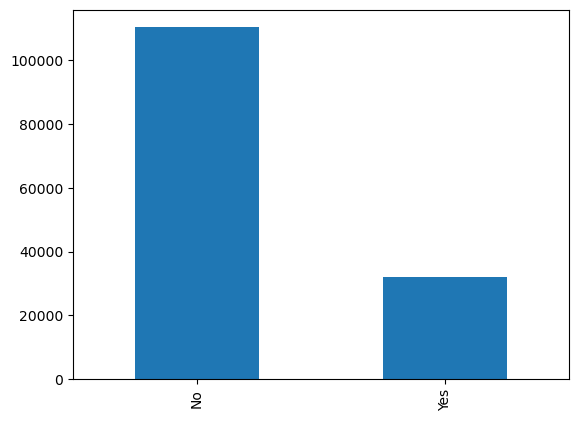

In [13]:
# Grafik Jumlah Data Target "RainTomorrow"
print("Target values counts:\n",df['RainTomorrow'].value_counts())
df['RainTomorrow'].value_counts().plot.bar()
plt.show()

    Analisis : kategori besok tidak akan turun hujan sebanyak 110.316, lebih banyak dibanding yang kategori besok akan turun hujan yang hanya 31.877

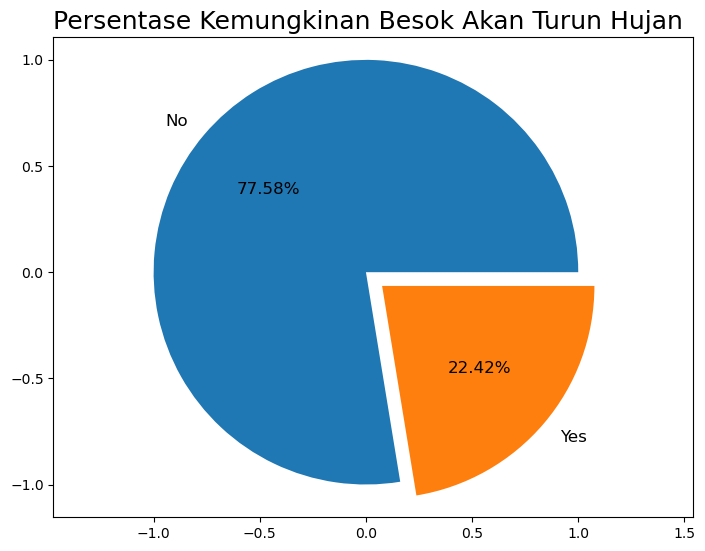

In [14]:
# Pie chart
labels = ["No", "Yes"]
explode = (0, 0.1)  # only "explode" the second slice (i.e. 'Subscribed')

# depicting the visualization 
fig = plt.figure() 
ax = fig.add_axes([0,0,1,1]) 

ax.pie(df['RainTomorrow'].value_counts(), 
       labels = labels,
       explode = explode,
       autopct ='%1.2f%%',
       frame = True,
       textprops = dict(color ="black", size=12)) 

ax.axis('equal') 
plt.title('Persentase Kemungkinan Besok Akan Turun Hujan',
     loc='left',
     color = 'black', 
     fontsize = '18')

plt.show()

    Analisis : kedua kategori tersebut tidak seimbang, dimana nilai positif yaitu kategori yes/besok akan turun hujan hanya sebesar 22,42% dibanding kategori no/besok akan tidak turun hujan sebesar 77,58%

### Resampling Class Imbalance 
Under-sampling dilakukan ketika dataset tidak seimbang dan salah satu kelas target memiliki jumlah sampel yang jauh lebih sedikit. Hal ini dapat menyebabkan model menjadi bias dan berkinerja buruk pada kelas minoritas. Dengan mengurangi jumlah sampel pada kelas mayoritas menjadi seimbang dengan kelas minoritas, under-sampling dapat membantu mengurangi bias dan meningkatkan kinerja model pada kelas minoritas.

Target values counts after under-sampling:
 No     31877
Yes    31877
Name: RainTomorrow, dtype: int64


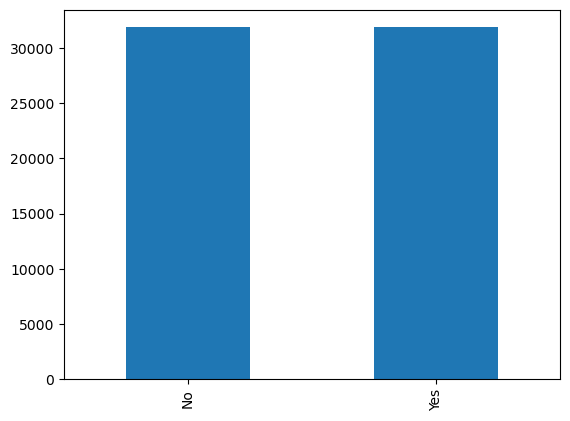

In [15]:
import random

# Count the number of samples for each target class
class_count = df['RainTomorrow'].value_counts()

# Define the target class with the smallest number of samples
minority_class = class_count.idxmin()

# Get the indices of the majority class samples and the minority class samples
majority_indices = df[df['RainTomorrow'] == 'No'].index
minority_indices = df[df['RainTomorrow'] == 'Yes'].index

# Randomly select a subset of the majority class samples
random_majority_indices = random.sample(list(majority_indices), len(minority_indices))

# Combine the minority class indices with the selected majority class indices
under_sample_indices = minority_indices.union(random_majority_indices)

# Create the under-sampled dataset
df = df.loc[under_sample_indices]

# Print the number of samples for each target class after under-sampling
print("Target values counts after under-sampling:\n", df['RainTomorrow'].value_counts())
df['RainTomorrow'].value_counts().plot.bar()
plt.show()

    Setelah dilakukan under-sampling, jumlah sampel pada kedua kelas target telah diseimbangkan menjadi 31.877 sampel. Hal ini dapat membantu model machine learning menjadi lebih objektif dan tidak bias terhadap satu kelas tertentu. Dengan kata lain, model yang dihasilkan dari dataset yang sudah diseimbangkan dapat berkinerja lebih baik dalam memprediksi kelas minoritas "Yes".

In [16]:
# Memeriksa Jumlah Baris dan Kolom
df.shape

(63754, 23)

    Setelah dilakukan under-sampling,terdapat 63.754 baris dan 23 kolom

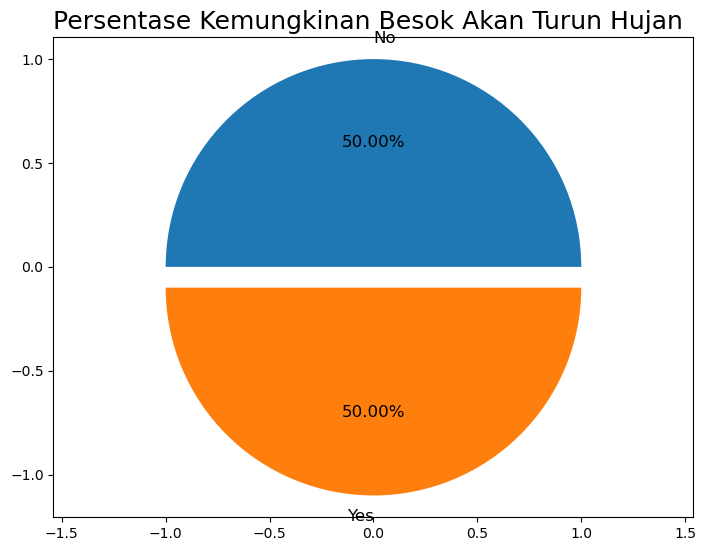

In [17]:
# Pie chart
labels = ["No", "Yes"]
explode = (0, 0.1)  # only "explode" the second slice (i.e. 'Subscribed')

# depicting the visualization 
fig = plt.figure() 
ax = fig.add_axes([0,0,1,1]) 

ax.pie(df['RainTomorrow'].value_counts(), 
       labels = labels,
       explode = explode,
       autopct ='%1.2f%%',
       frame = True,
       textprops = dict(color ="black", size=12)) 

ax.axis('equal') 
plt.title('Persentase Kemungkinan Besok Akan Turun Hujan',
     loc='left',
     color = 'black', 
     fontsize = '18')

plt.show()

    Analisis : kedua kategori tersebut sudah seimbang, dimana nilai positif yaitu kategori yes/turun hujna sama dengan kategori no/tidak akan turun hujan, nilainya sama-sama 50%

## Data Cleaning
Bagian ini berisi proses penyiapan data berupa data cleaning sebelum dilakukan explorasi data lebih lanjut.

### Pengecekan kolom

In [18]:
# Konversi kolom 'Date' menjadi tipe data datetime
df['Date'] = pd.to_datetime(df['Date'])
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
10,2008-12-11,Albury,13.4,30.4,0.0,NaN,NaN,N,30.0,SSE,ESE,17.0,6.0,48.0,22.0,1011.8,1008.7,NaN,NaN,20.4,28.8,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145436,2017-06-02,Uluru,1.5,19.2,0.0,NaN,NaN,E,37.0,ESE,ESE,17.0,22.0,45.0,18.0,1030.7,1026.7,NaN,NaN,6.8,17.6,No,No
145445,2017-06-11,Uluru,2.4,19.1,0.0,NaN,NaN,E,33.0,SE,E,17.0,17.0,59.0,24.0,1030.0,1026.2,NaN,NaN,8.0,18.8,No,No
145453,2017-06-19,Uluru,7.4,20.6,0.0,NaN,NaN,E,35.0,ESE,E,15.0,17.0,63.0,33.0,1027.2,1023.3,NaN,NaN,11.0,20.3,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


In [19]:
# Mengecek detail kolom mulai dari jumlah, tipe data, dan data null
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63754 entries, 2 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           63754 non-null  datetime64[ns]
 1   Location       63754 non-null  object        
 2   MinTemp        63436 non-null  float64       
 3   MaxTemp        63610 non-null  float64       
 4   Rainfall       62874 non-null  float64       
 5   Evaporation    36242 non-null  float64       
 6   Sunshine       33498 non-null  float64       
 7   WindGustDir    59362 non-null  object        
 8   WindGustSpeed  59400 non-null  float64       
 9   WindDir9am     59462 non-null  object        
 10  WindDir3pm     61951 non-null  object        
 11  WindSpeed9am   63140 non-null  float64       
 12  WindSpeed3pm   62540 non-null  float64       
 13  Humidity9am    62842 non-null  float64       
 14  Humidity3pm    62021 non-null  float64       
 15  Pressure9am    575

In [20]:
# Membuat Kolom Tanggal, Bulan, dan Tahun dari kolom date
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No,6,12,2008
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes,9,12,2008
10,2008-12-11,Albury,13.4,30.4,0.0,NaN,NaN,N,30.0,SSE,ESE,17.0,6.0,48.0,22.0,1011.8,1008.7,NaN,NaN,20.4,28.8,No,Yes,11,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145436,2017-06-02,Uluru,1.5,19.2,0.0,NaN,NaN,E,37.0,ESE,ESE,17.0,22.0,45.0,18.0,1030.7,1026.7,NaN,NaN,6.8,17.6,No,No,2,6,2017
145445,2017-06-11,Uluru,2.4,19.1,0.0,NaN,NaN,E,33.0,SE,E,17.0,17.0,59.0,24.0,1030.0,1026.2,NaN,NaN,8.0,18.8,No,No,11,6,2017
145453,2017-06-19,Uluru,7.4,20.6,0.0,NaN,NaN,E,35.0,ESE,E,15.0,17.0,63.0,33.0,1027.2,1023.3,NaN,NaN,11.0,20.3,No,No,19,6,2017
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,23,6,2017


In [21]:
# Mengecek kembali detail kolom mulai dari jumlah, tipe data, dan data null
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63754 entries, 2 to 145458
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           63754 non-null  datetime64[ns]
 1   Location       63754 non-null  object        
 2   MinTemp        63436 non-null  float64       
 3   MaxTemp        63610 non-null  float64       
 4   Rainfall       62874 non-null  float64       
 5   Evaporation    36242 non-null  float64       
 6   Sunshine       33498 non-null  float64       
 7   WindGustDir    59362 non-null  object        
 8   WindGustSpeed  59400 non-null  float64       
 9   WindDir9am     59462 non-null  object        
 10  WindDir3pm     61951 non-null  object        
 11  WindSpeed9am   63140 non-null  float64       
 12  WindSpeed3pm   62540 non-null  float64       
 13  Humidity9am    62842 non-null  float64       
 14  Humidity3pm    62021 non-null  float64       
 15  Pressure9am    575

In [22]:
# Menghapus atribut Date karena sudah diganti dengan atribut Day, Month, Year.
df.drop('Date', axis = 1, inplace = True)
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008
5,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No,6,12,2008
8,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes,9,12,2008
10,Albury,13.4,30.4,0.0,NaN,NaN,N,30.0,SSE,ESE,17.0,6.0,48.0,22.0,1011.8,1008.7,NaN,NaN,20.4,28.8,No,Yes,11,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145436,Uluru,1.5,19.2,0.0,NaN,NaN,E,37.0,ESE,ESE,17.0,22.0,45.0,18.0,1030.7,1026.7,NaN,NaN,6.8,17.6,No,No,2,6,2017
145445,Uluru,2.4,19.1,0.0,NaN,NaN,E,33.0,SE,E,17.0,17.0,59.0,24.0,1030.0,1026.2,NaN,NaN,8.0,18.8,No,No,11,6,2017
145453,Uluru,7.4,20.6,0.0,NaN,NaN,E,35.0,ESE,E,15.0,17.0,63.0,33.0,1027.2,1023.3,NaN,NaN,11.0,20.3,No,No,19,6,2017
145457,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,23,6,2017


In [23]:
# Memperbarui list atribut bertipe kategorik
categorical = [i for i in df.columns if i not in numerical]

# Memperbarui list atribut bertipe numerik
numerical = [i for i in df.columns if i not in categorical]
print('categorical:', categorical, '\n', '\n', 'numerical: ', numerical)

categorical: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'] 
 
 numerical:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


### Pengecekan Missing Value
Pada bagian ini akan dilakukan pengecekan terhadap missing value, kemudian missing value tersebut akan ditangani sesuai karakteristik dari data tersebut

In [24]:
# Melakukan pengecekan duplikasi data
df.duplicated().sum()

0

In [25]:
# Check null values
print("Is there any null values in the data ? \n",df.isnull().values.any())

Is there any null values in the data ? 
 True


In [26]:
# Memeriksa missing value
missing_values_count = df.isna().sum()
missing_values_count

Location             0
MinTemp            318
MaxTemp            144
Rainfall           880
Evaporation      27512
Sunshine         30256
WindGustDir       4392
WindGustSpeed     4354
WindDir9am        4292
WindDir3pm        1803
WindSpeed9am       614
WindSpeed3pm      1214
Humidity9am        912
Humidity3pm       1733
Pressure9am       6175
Pressure3pm       6179
Cloud9am         23530
Cloud3pm         24663
Temp9am            477
Temp3pm           1318
RainToday          880
RainTomorrow         0
Day                  0
Month                0
Year                 0
dtype: int64

In [27]:
# Menghitung Persentase Missing Value
cell = np.product(df.shape)
missingvalue = missing_values_count.sum()
print('Jumlah Missing Value: ', missingvalue)

percentage_mv = (missingvalue/cell)*100
print('Jumlah Persentase Missing Value:', percentage_mv, '%')

Jumlah Missing Value:  141646
Jumlah Persentase Missing Value: 8.887034539009317 %


    Secara keseluruhan, persentase data yang hilang adalah 8.89%

In [28]:
# Melihat persentase missing value tiap atribut
missing_value = df.apply(lambda x: f'{((x.isnull().sum()/df.shape[0])*100).round(2)} %').sort_values(ascending=True)
missing_value

Location           0.0 %
Day                0.0 %
RainTomorrow       0.0 %
Month              0.0 %
Year               0.0 %
MaxTemp           0.23 %
MinTemp            0.5 %
Temp9am           0.75 %
WindSpeed9am      0.96 %
RainToday         1.38 %
Rainfall          1.38 %
Humidity9am       1.43 %
WindSpeed3pm       1.9 %
Temp3pm           2.07 %
Humidity3pm       2.72 %
WindDir3pm        2.83 %
Cloud9am         36.91 %
Cloud3pm         38.68 %
Evaporation      43.15 %
Sunshine         47.46 %
WindDir9am        6.73 %
WindGustSpeed     6.83 %
WindGustDir       6.89 %
Pressure3pm       9.69 %
Pressure9am       9.69 %
dtype: object

    Terdapat 21 atribut yang memiliki missing value

drop baris yang memiliki nilai null pada kolom RainToday atau RainTomorrow karena jika diisi modus khawatir akan membuat prediksi kurang akurat

In [29]:
# drop nilai null RainToday atau RainTomorrow
df2 = df.drop(df[(df['RainToday'].isnull()) | (df['RainTomorrow'].isnull())].index)
df2

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008
5,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No,6,12,2008
8,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes,9,12,2008
10,Albury,13.4,30.4,0.0,NaN,NaN,N,30.0,SSE,ESE,17.0,6.0,48.0,22.0,1011.8,1008.7,NaN,NaN,20.4,28.8,No,Yes,11,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145436,Uluru,1.5,19.2,0.0,NaN,NaN,E,37.0,ESE,ESE,17.0,22.0,45.0,18.0,1030.7,1026.7,NaN,NaN,6.8,17.6,No,No,2,6,2017
145445,Uluru,2.4,19.1,0.0,NaN,NaN,E,33.0,SE,E,17.0,17.0,59.0,24.0,1030.0,1026.2,NaN,NaN,8.0,18.8,No,No,11,6,2017
145453,Uluru,7.4,20.6,0.0,NaN,NaN,E,35.0,ESE,E,15.0,17.0,63.0,33.0,1027.2,1023.3,NaN,NaN,11.0,20.3,No,No,19,6,2017
145457,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,23,6,2017


In [30]:
# Memeriksa Jumlah Baris dan Kolom
print("Shape of the data:",df.shape)
print("Shape of the new data:",df2.shape)

Shape of the data: (63754, 25)
Shape of the new data: (62874, 25)


In [31]:
# Memeriksa missing value kembali missing value setelah drop RainToday & RainTomorrow 
missing_value = df2.apply(lambda x: f'{((x.isnull().sum()/df2.shape[0])*100).round(2)} %').sort_values(ascending=True)
missing_value

Location           0.0 %
Day                0.0 %
RainTomorrow       0.0 %
RainToday          0.0 %
Month              0.0 %
Year               0.0 %
Rainfall           0.0 %
MaxTemp           0.21 %
MinTemp           0.35 %
Temp9am           0.54 %
WindSpeed9am      0.73 %
Humidity9am       1.22 %
WindSpeed3pm      1.84 %
Temp3pm           1.99 %
Humidity3pm       2.64 %
WindDir3pm        2.77 %
Cloud9am         36.46 %
Cloud3pm          38.3 %
Evaporation      42.62 %
Sunshine         47.17 %
WindDir9am        6.53 %
WindGustSpeed     6.78 %
WindGustDir       6.83 %
Pressure9am       9.59 %
Pressure3pm       9.64 %
dtype: object

    sudah tidak ada lagi missing value pada variabel target, selanjutnya perlu ditangani missing value pada variabel kategorik dan numerik

Mengisi baris yang merupakan missing value :
* Atribut bertipe numerik yang terdapat missing value akan ditangani dengan imputasi median
* Atribut bertipe kategorik/ object yang terdapat missing value akan ditangani dengan imputasi modus

In [32]:
# Mengisi baris yang merupakan missing value
float_cols = df2.select_dtypes(include = ['float']).columns
cat_var = ['WindGustDir', 'WindDir9am', 'WindDir3pm']
for col in float_cols:
    df2[col] = df2[col].fillna(df2[col].median())
for col in cat_var :
    df2[col] = df2[col].fillna(df2[col].mode()[0])

In [33]:
# Mengecek total mising value
df2.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Day              0
Month            0
Year             0
dtype: int64

    sudah tidak terdapat missing value pada data

In [34]:
# Memeriksa Jumlah Baris dan Kolom
print("Shape of the data:",df.shape)
print("Shape of the new data:",df2.shape)

Shape of the data: (63754, 25)
Shape of the new data: (62874, 25)


    Setelah cleaning, data memiliki 62.874 baris serta 25 kolom. Data tersebut akan dipakai untuk pembuatan dan pengujian model

## Explorasi Data
Pada bagian ini akan dilakukan eksplorasi pada dataset untuk melihat karakteristik atau keadaan setiap variabel data berdasarkan visualisasi

In [35]:
# Memperbarui list atribut bertipe kategorik
categorical = [i for i in df2.columns if i not in numerical]

# Memperbarui list atribut bertipe numerik
numerical = [i for i in df2.columns if i not in categorical]
print('categorical:', categorical, '\n', '\n', 'numerical: ', numerical)

categorical: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'] 
 
 numerical:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


**Rangkuman variabel kategorikal**

- Terdapat variabel tanggal.  Ini ditandai dengan kolom `Day`, `Month`, `Year`.
- Terdapat 6 variabel kategorikal yaitu `Location`, `WindGustDir`, `WindDir9am`, `WindDir3pm`, `RainToday` dan  `RainTomorrow`.
- Terdapat dua variabel kategorikal biner yaitu `RainToday` and  `RainTomorrow`.
- `RainTomorrow` adalah variabel target.

**Rangkuman variabel numerikal**
- Terdapat 16 variabel numerik. 
- Variabel-variabel tersebut yaitu `MinTemp`, `MaxTemp`, `Rainfall`, `Evaporation`, `Sunshine`, `WindGustSpeed`, `WindSpeed9am`, `WindSpeed3pm`, `Humidity9am`, `Humidity3pm`, `Pressure9am`, `Pressure3pm`, `Cloud9am`, `Cloud3pm`, `Temp9am` dan `Temp3pm`.
- Semua variabel numerik adalah tipe kontinu.

In [36]:
# Melihat statistik deskriptif pada data yang bertipe numerik
print('Discrption of Numeric Data : ')
df2.describe()

Discrption of Numeric Data : 


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
count,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.000000,62874.00000
mean,12.544112,22.494255,3.701820,4.836758,6.697590,41.867433,14.510704,19.120877,72.026338,57.586315,1016.495120,1014.202120,5.391815,5.500159,16.880206,20.802732,15.713793,6.424484,2012.73738
std,6.382551,7.109227,11.067865,3.090392,2.875016,14.170767,9.189885,9.102221,18.560809,21.587181,6.985315,6.916994,2.259396,2.092909,6.445264,6.876521,8.822368,3.387069,2.54318
min,-8.200000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.000000,-5.100000,1.000000,1.000000,2007.00000
25%,8.000000,17.200000,0.000000,3.800000,6.500000,33.000000,7.000000,13.000000,61.000000,43.000000,1012.200000,1009.900000,5.000000,5.000000,12.100000,15.800000,8.000000,4.000000,2010.00000
50%,12.300000,21.800000,0.000000,4.400000,6.900000,39.000000,13.000000,19.000000,74.000000,58.000000,1016.500000,1014.200000,6.000000,6.000000,16.500000,20.100000,16.000000,6.000000,2013.00000
75%,17.200000,27.500000,2.200000,5.000000,7.200000,50.000000,20.000000,24.000000,87.000000,73.000000,1020.800000,1018.500000,7.000000,7.000000,21.400000,25.400000,23.000000,9.000000,2015.00000
max,30.700000,46.800000,371.000000,145.000000,14.300000,135.000000,130.000000,87.000000,100.000000,100.000000,1040.100000,1038.000000,9.000000,9.000000,39.400000,46.100000,31.000000,12.000000,2017.00000


    Diperoleh bahwa:
    * curah hujan rata-rata 3.70
    * kecepatan angin rata-rata berada pada 41.87
    * suhu terendah pada suhu minimum mencapai -8.2 derajat
    * suhu tertinggi pada suhu maksimum mencapai 46.8 derajat

In [37]:
# Melihat statistik descriptif pada data kategorik
print('Discrption of Categorical Data : ')
df2.describe(include="O")

Discrption of Categorical Data : 


,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,62874,62874,62874,62874,62874,62874
unique,49,16,16,16,2,2
top,Portland,W,N,W,No,No
freq,1660,8897,9781,6364,43407,31673


    Diperoleh bahwa:
    * Terdapat 49 lokasi dengan lokasi paling banyak terletak di Portland
    * Tidak hujan (No) lebih dominan pada atribut RainToday dan RainTomorrow
    * Arah angin paling sering adalah W (West)
    * Arah angin 9pagi paling sering adalah N (North)
    * Arah angin 3sore paling sering adalah W (West)

### Visualisasi Variabel Kategorik

**Location**

In [38]:
# Memeriksa jumlah nilai unik pada 'Location'
print('Location memiliki', len(df2.Location.unique()), 'labels')

Location memiliki 49 labels


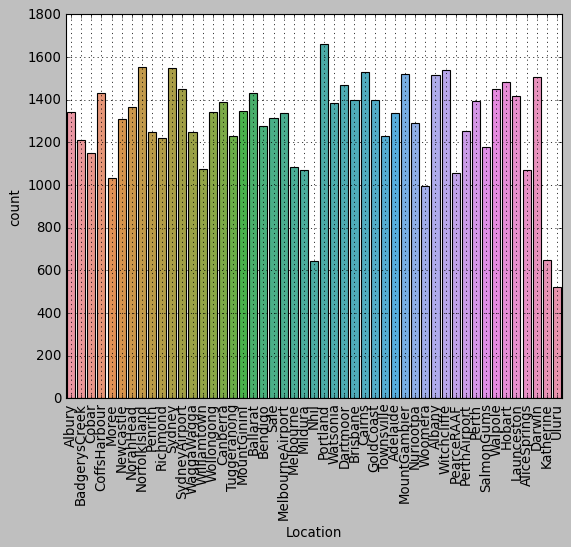

In [39]:
plt.style.use("classic")
sns.countplot(data=df2, x="Location")
plt.grid(linewidth = 0.7)
plt.xticks(rotation=90)
plt.show()

    Dari plot diatas, dapat disimpulkan bahwa Lokasi paling banyak hujan terdapat di lokasi Portland.

    Portland merupakan kota yang terletak di wilayah Pasifik Barat laut Amerika Serikat, di mana daerah ini secara geografis terkenal dengan curah hujan yang tinggi. Beberapa alasan yang menyebabkan Portland mengalami curah hujan yang paling tinggi antara lain:
    * Letak geografis: Portland terletak di wilayah pesisir barat laut yang berhadapan langsung dengan Samudra Pasifik. Udara lembap dari Samudra Pasifik dapat dengan mudah menyeberangi Pegunungan Cascade dan terbawa hingga ke wilayah Portland, sehingga menyebabkan curah hujan yang tinggi.
    * Medan pegunungan: Portland dikelilingi oleh Pegunungan Cascade yang tingginya mencapai lebih dari 3.000 meter di atas permukaan laut. Pegunungan ini dapat mempengaruhi pola aliran udara dan mengakibatkan adanya pendinginan udara, sehingga dapat memicu pembentukan awan dan curah hujan yang tinggi.
    * Pola aliran udara: Selama musim dingin, sistem tekanan rendah di Samudra Pasifik dapat memicu pola aliran udara yang mengarah ke wilayah pesisir barat laut Amerika Serikat, termasuk di wilayah Portland. Pola ini dapat menyebabkan adanya hujan lebat dan cuaca buruk lainnya.

    Dengan demikian, kombinasi dari letak geografis, medan pegunungan, dan pola aliran udara adalah beberapa faktor yang menyebabkan Portland mengalami curah hujan yang paling tinggi.

**WinGustDir**

In [40]:
# Memeriksa jumlah nilai unik pada 'WindGustDir'
print('WindGustDir memiliki', len(df2.WindGustDir.unique()), 'labels')

WindGustDir memiliki 16 labels


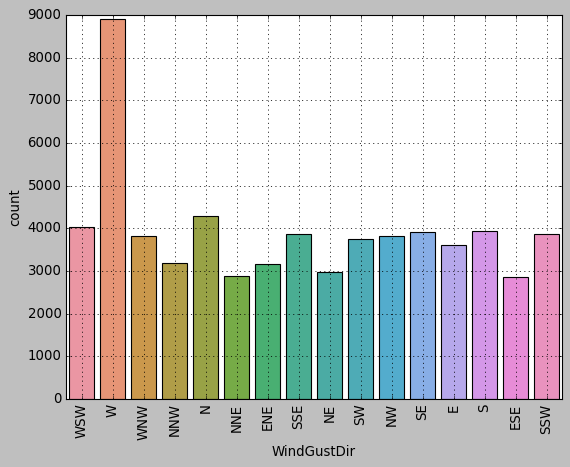

In [41]:
plt.style.use("classic")
sns.countplot(data=df2, x="WindGustDir")
plt.grid(linewidth = 0.7)
plt.xticks(rotation=90)
plt.show()

    Plot di atas menunjukkan jumlah frekuensi arah angin pada saat terjadi angin kencang (WindGustDir). Dapat dilihat dari plot tersebut bahwa frekuensi angin yang bertiup dari arah barat (W) adalah yang paling tinggi, sedangkan frekuensi angin yang bertiup dari arah timur tenggara (ESE) adalah yang paling rendah

**WindDir9am**

In [42]:
# Memeriksa jumlah nilai unik pada 'WindDir9am'
print('WindDir9am memiliki', len(df2.WindDir9am.unique()), 'labels')

WindDir9am memiliki 16 labels


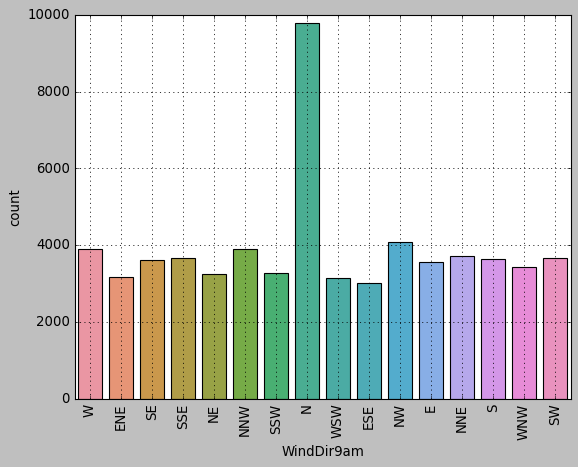

In [43]:
plt.style.use("classic")
sns.countplot(data=df2, x="WindDir9am")
plt.grid(linewidth = 0.7)
plt.xticks(rotation=90)
plt.show()

    Dari plot tersebut menunjukkan frekuensi arah angin pada pukul 9 pagi (WinDir9am). Terlihat dari grafik bahwa arah angin yang bertiup dari arah utara (N) memiliki frekuensi paling tinggi, sedangkan arah angin yang bertiup dari arah timur tenggara (ESE) memiliki frekuensi paling rendah. Pengukuran arah angin ini mungkin tergantung pada lokasi stasiun cuaca yang berbeda.

**WindDir3pm**

In [44]:
# Memeriksa jumlah nilai unik pada 'WindDir3pm'
print('WindDir3pm memiliki', len(df2.WindDir3pm.unique()), 'labels')

WindDir3pm memiliki 16 labels


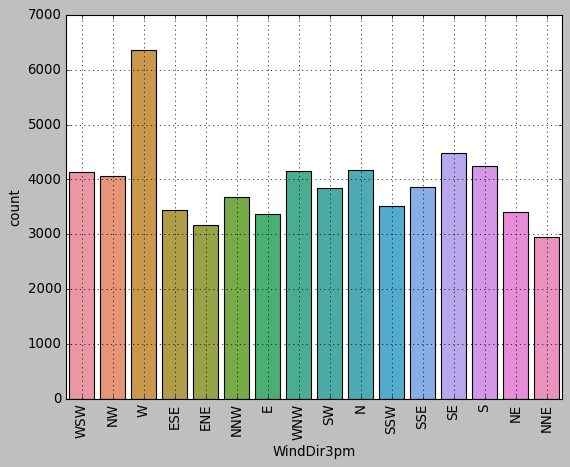

In [45]:
plt.style.use("classic")
sns.countplot(data=df2, x="WindDir3pm")
plt.grid(linewidth = 0.7)
plt.xticks(rotation=90)
plt.show()

    Plot tersebut menunjukkan jumlah frekuensi arah angin pada pukul 3 sore (WinDir3pm) dari data cuaca yang tersedia. Dari plot tersebut, terlihat bahwa angin yang bertiup dari arah barat (W) memiliki frekuensi paling tinggi, sementara angin yang bertiup dari arah utara laut (NNE) memiliki frekuensi paling rendah.

**RainToday**

In [46]:
# periksa distribusi frekuensi nilai dalam variabel RainToday
df2.RainToday.value_counts()

No     43407
Yes    19467
Name: RainToday, dtype: int64

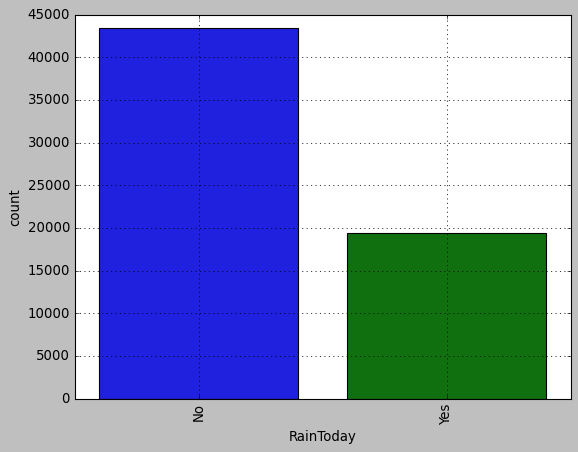

In [47]:
plt.style.use("classic")
sns.countplot(data=df2, x="RainToday")
plt.grid(linewidth = 0.7)
plt.xticks(rotation=90)
plt.show()

    Kesimpulan : kemungkinan tidak hujan hari ini lebih banyak dibandingkan dengan kemungkinan hujan hari ini. Hal ini dapat dilihat dari jumlah data yang terkumpul untuk masing-masing kategori "RainToday". Pada kategori "No" yang menunjukkan tidak hujan hari ini, jumlah data lebih banyak dibandingkan dengan kategori "Yes" yang menunjukkan hujan hari ini

**RainTomorrow**

In [48]:
# periksa distribusi frekuensi nilai dalam variabel RainTomorrow
df2.RainTomorrow.value_counts()

No     31673
Yes    31201
Name: RainTomorrow, dtype: int64

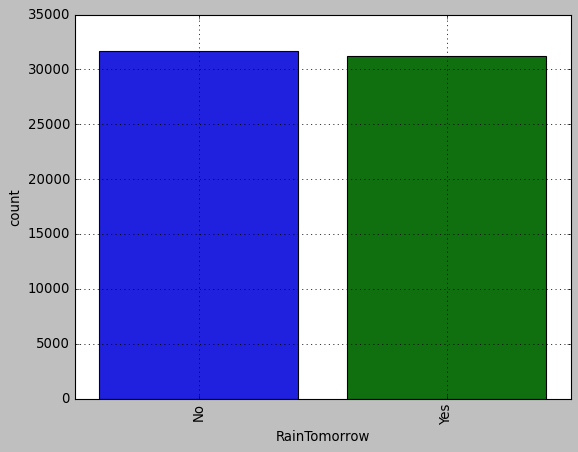

In [49]:
plt.style.use("classic")
sns.countplot(data=df2, x="RainTomorrow")
plt.grid(linewidth = 0.7)
plt.xticks(rotation=90)
plt.show()

    Kesimpulan : kemungkinan tidak hujan besok sama dengan kemungkinan hujan besok. Hal ini dapat dilihat dari jumlah data yang terkumpul untuk masing-masing kategori "RainTomorrow". Pada kategori "No" yang menunjukkan hari besok tidak akan hujan, jumlah data sama dengan kategori "Yes" yang menunjukkan hari besok akan hujan

### Persebaran Data

In [50]:
# Melihat persebaran data antara Lokasi dan RainTomorrow
px.histogram(df2, x='Location', 
             title='Location vs. Rainy Days', 
             color='RainToday')

    Plot di atas menampilkan histogram frekuensi jumlah hari hujan pada setiap lokasi (Location). Histogram ini diwarnai berdasarkan apakah hari itu hujan atau tidak (RainToday)
    * Distribusi curah hujan kurang lebih seragam di seluruh lokasi
    * Terdapat beberapa lokasi seperti Nhil, Katherine, dan Uluru yang memiliki curah hujan paling sedikit 
    * Lokasi Portland menerima curah hujan paling banyak di antara 49 lokasi yang tersedia dalam dataset

In [51]:
# Melihat persebaran data antara Temperatur at 3pm dan RainTomorrow
px.histogram(df2, x='Temp3pm', title='Temperature at 3 pm vs. Rain Tomorrow', color='RainTomorrow')

    Plot di atas menunjukkan distribusi suhu pada pukul 3 sore (Temp3pm) terhadap kemungkinan hujan besok (RainTomorrow). Dari plot tersebut dapat dilihat bahwa pada suhu sekitar 19-21 derajat Celsius, kemungkinan hujan besok lebih tinggi dibandingkan dengan suhu di luar rentang tersebut. Selain itu, pada suhu di atas 30 derajat Celsius, kemungkinan hujan besok cenderung lebih rendah. Terdapat perbedaan pola yang cukup signifikan antara kemungkinan hujan besok pada suhu yang lebih rendah dan lebih tinggi

In [52]:
# Melihat persebaran data antara RainTomorrow dan RainToday
px.histogram(df2, x='RainTomorrow', color='RainToday', title='Rain Tomorrow vs. Rain Today')

    Plot histogram di atas menunjukkan jumlah frekuensi hari dimana hari ini dan besoknya turun hujan. Sumbu x menunjukkan apakah besok akan turun hujan atau tidak, sedangkan sumbu y menunjukkan jumlah frekuensi. Warna plot membedakan apakah hari ini turun hujan atau tidak.

    Dari plot tersebut, dapat dilihat bahwa ketika hari ini turun hujan, kemungkinan besok juga turun hujan lebih tinggi dibandingkan ketika hari ini tidak turun hujan. Selain itu, terdapat lebih banyak hari di mana hari ini dan besoknya tidak turun hujan dibandingkan dengan yang turun hujan.

    Dari sini, dapat disimpulkan bahwa hujan hari ini mempengaruhi kemungkinan hujan besok.

In [53]:
# Melihat persebaran data antara Cloud at 3pm dan RainTomorrow
px.histogram(df2, x='Cloud3pm',title='Cloud at 3 pm vs. Rain Tomorrow', color='RainTomorrow')

    Plot histogram di atas menunjukkan hubungan antara jumlah awan pada pukul 3 sore (Cloud3pm) dengan kemungkinan turun hujan besok (RainTomorrow). Dapat dilihat bahwa ketika jumlah awan semakin sedikit (0-3), kemungkinan hujan besok cenderung rendah. Namun ketika jumlah awan semakin banyak (4-6), kemungkinan hujan besok cenderung meningkat. Plot juga menunjukkan bahwa ketika jumlah awan mencapai 6, kemungkinan turun hujan besok mencapai puncaknya.

### Correlation Matrix

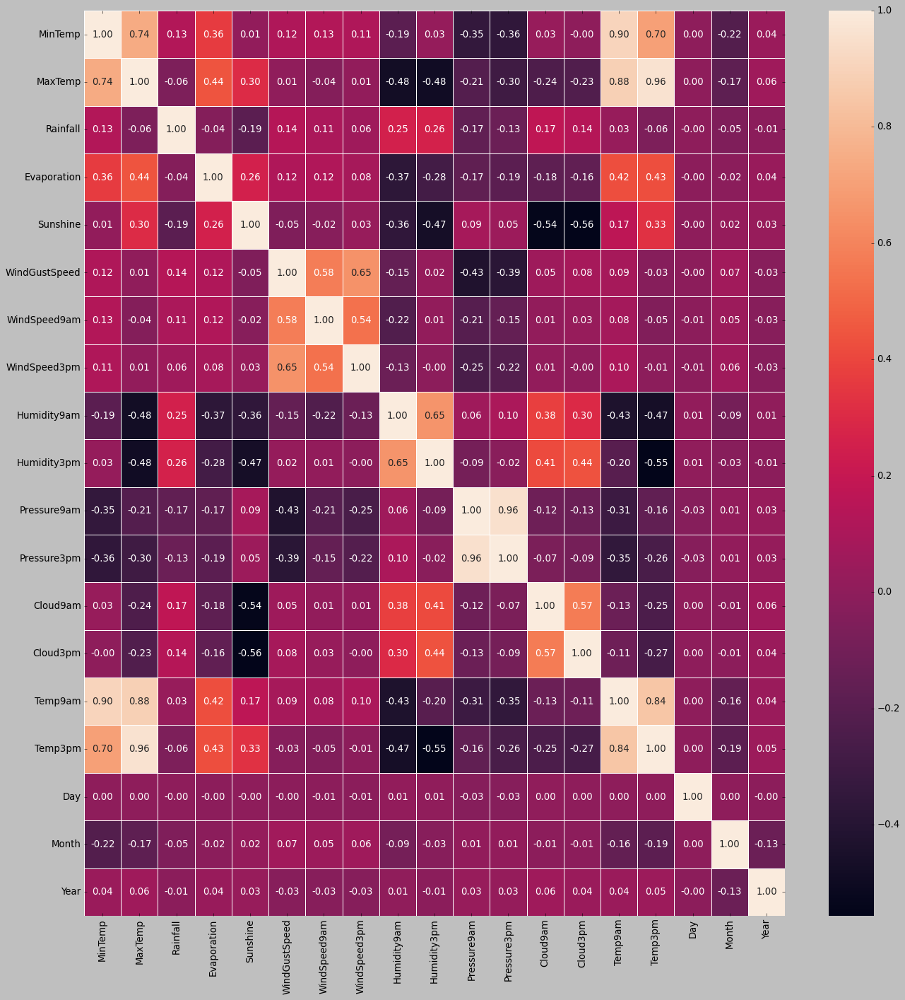

In [54]:
# Mengecek matrix korealsi 
fig, ax = plt.subplots(figsize=(20,20))
cm = sns.heatmap(df2.corr(), linewidths = .5, annot=True, fmt='.2f')

    Terlihat bahwa terdapat korelasi yang tinggi (>0,8) diantara atribut :
    * MinTemp dan Temp9am,
    * MaxTemp dan Temp9am,
    * MaxTemp dan Temp3pm,
    * Pressure9am dan Pressure3pm,
    * Temp3pm dan Temp9am,
    yang berarti atribut tsb merepresentasikan informasi yang sama. Oleh karena itu, harus dikeluarkan salah satu

    menghitung korelasi Pearson antara fitur menggunakan metode corr(). Kami mengisi diagonal matriks dengan nilai 0, karena korelasi antara suatu fitur dengan dirinya sendiri adalah 1. Kemudian, kami mencari pasangan fitur dengan korelasi Pearson di atas 0.8 dan mencetak hasilnya. 

In [55]:
# Mencari korelasi Pearson antara fitur
corr_matrix = df2.corr().abs()

# Membuat matriks diagonal dengan nilai 1
np.fill_diagonal(corr_matrix.values, 0)

# Mencari pasangan fitur dengan korelasi Pearson > 0.8
high_corr = np.where(corr_matrix > 0.8)

# Menampilkan pasangan fitur yang berkorelasi tinggi
for i in range(len(high_corr[0])):
    row = high_corr[0][i]
    col = high_corr[1][i]
    corr = corr_matrix.iloc[row, col]
    print(f"Fitur {corr_matrix.columns[row]} dan {corr_matrix.columns[col]} berkorelasi tinggi ({corr})")

Fitur MinTemp dan Temp9am berkorelasi tinggi (0.9032404048956643)
Fitur MaxTemp dan Temp9am berkorelasi tinggi (0.8844725043364191)
Fitur MaxTemp dan Temp3pm berkorelasi tinggi (0.9632607951926269)
Fitur Pressure9am dan Pressure3pm berkorelasi tinggi (0.9566801587263157)
Fitur Pressure3pm dan Pressure9am berkorelasi tinggi (0.9566801587263157)
Fitur Temp9am dan MinTemp berkorelasi tinggi (0.9032404048956643)
Fitur Temp9am dan MaxTemp berkorelasi tinggi (0.8844725043364191)
Fitur Temp9am dan Temp3pm berkorelasi tinggi (0.8441361827368743)
Fitur Temp3pm dan MaxTemp berkorelasi tinggi (0.9632607951926269)
Fitur Temp3pm dan Temp9am berkorelasi tinggi (0.8441361827368743)


In [56]:
# Menghapus kolom yang berkorelasi tinggi
df3 = df2.drop(['Pressure3pm','MaxTemp','Pressure9am','Temp9am'],axis = 1)
df3

,Location,MinTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
2,Albury,12.9,0.0,4.4,6.9,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,6.0,2.0,23.2,No,No,3,12,2008
4,Albury,17.5,1.0,4.4,6.9,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,7.0,8.0,29.7,No,No,5,12,2008
5,Albury,14.6,0.2,4.4,6.9,WNW,56.0,W,W,19.0,24.0,55.0,23.0,6.0,6.0,28.9,No,No,6,12,2008
8,Albury,9.7,0.0,4.4,6.9,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,6.0,6.0,30.2,No,Yes,9,12,2008
10,Albury,13.4,0.0,4.4,6.9,N,30.0,SSE,ESE,17.0,6.0,48.0,22.0,6.0,6.0,28.8,No,Yes,11,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145436,Uluru,1.5,0.0,4.4,6.9,E,37.0,ESE,ESE,17.0,22.0,45.0,18.0,6.0,6.0,17.6,No,No,2,6,2017
145445,Uluru,2.4,0.0,4.4,6.9,E,33.0,SE,E,17.0,17.0,59.0,24.0,6.0,6.0,18.8,No,No,11,6,2017
145453,Uluru,7.4,0.0,4.4,6.9,E,35.0,ESE,E,15.0,17.0,63.0,33.0,6.0,6.0,20.3,No,No,19,6,2017
145457,Uluru,5.4,0.0,4.4,6.9,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,6.0,6.0,26.1,No,No,23,6,2017


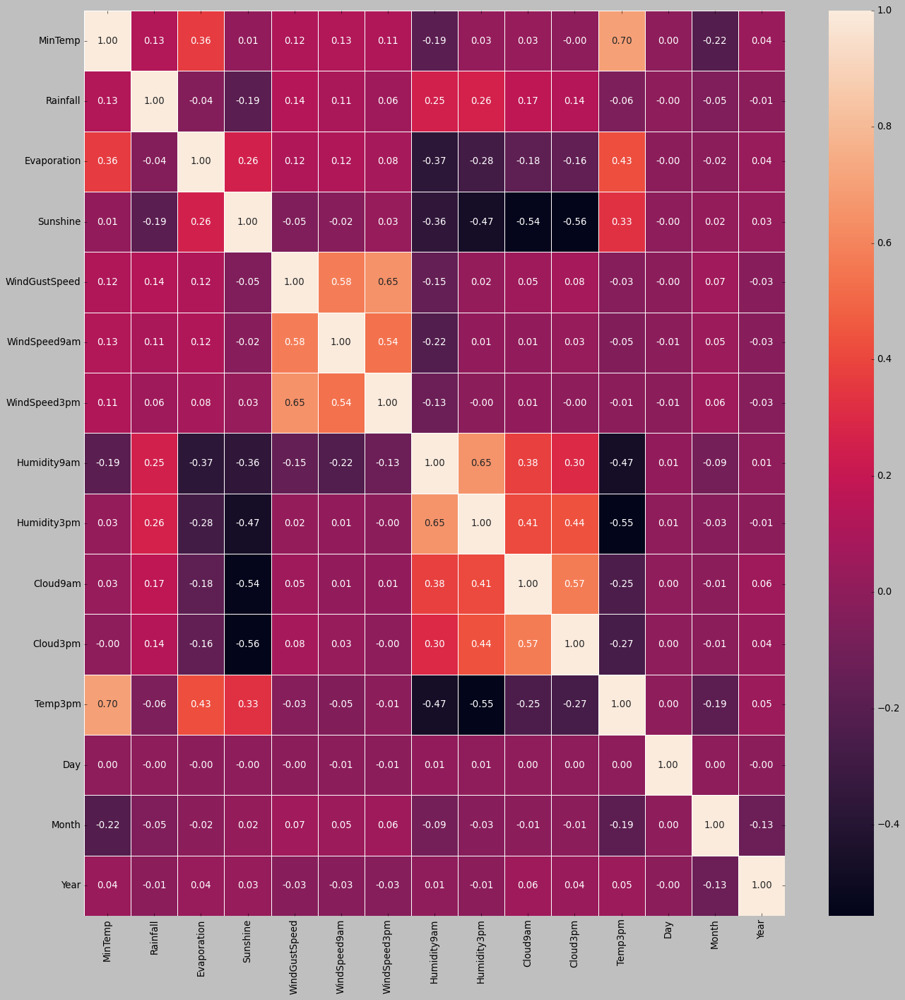

In [57]:
# Mengecek matrix korealsi kembali
fig, ax = plt.subplots(figsize=(20,20))
cm = sns.heatmap(df3.corr(), linewidths = .5, annot=True, fmt='.2f')

    Terlihat bahwa sudah tidak terdapat korelasi yang tinggi (>0,8) diantara atribut diatas

## Data Preprocessing
Bagian ini berisi proses penyiapan data untuk proses pelatihan model, seperti pembagian data menjadi train-dev-test, transformasi data (normalisasi, encoding, dll.), dan proses-proses lain yang dibutuhkan.

In [58]:
# Memperbarui list atribut bertipe kategorik
categorical = [i for i in df3.columns if i not in numerical]

# Memperbarui list atribut bertipe numerik
numerical = [i for i in df3.columns if i not in categorical]
print('categorical:', categorical, '\n', '\n', 'numerical: ', numerical)

categorical: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'] 
 
 numerical:  ['MinTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'Temp3pm']


In [59]:
# Mengecek detail kolom mulai dari jumlah, tipe data, dan data null
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 62874 entries, 2 to 145458
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       62874 non-null  object 
 1   MinTemp        62874 non-null  float64
 2   Rainfall       62874 non-null  float64
 3   Evaporation    62874 non-null  float64
 4   Sunshine       62874 non-null  float64
 5   WindGustDir    62874 non-null  object 
 6   WindGustSpeed  62874 non-null  float64
 7   WindDir9am     62874 non-null  object 
 8   WindDir3pm     62874 non-null  object 
 9   WindSpeed9am   62874 non-null  float64
 10  WindSpeed3pm   62874 non-null  float64
 11  Humidity9am    62874 non-null  float64
 12  Humidity3pm    62874 non-null  float64
 13  Cloud9am       62874 non-null  float64
 14  Cloud3pm       62874 non-null  float64
 15  Temp3pm        62874 non-null  float64
 16  RainToday      62874 non-null  object 
 17  RainTomorrow   62874 non-null  object 
 18  Day  

### Outliers in numerical variables

In [60]:
# view summary statistics in numerical variables
print(round(df3[numerical].describe()),2)

       MinTemp  Rainfall  Evaporation  Sunshine  WindGustSpeed  WindSpeed9am  \
count  62874.0   62874.0      62874.0   62874.0        62874.0       62874.0   
mean      13.0       4.0          5.0       7.0           42.0          15.0   
std        6.0      11.0          3.0       3.0           14.0           9.0   
min       -8.0       0.0          0.0       0.0            6.0           0.0   
25%        8.0       0.0          4.0       6.0           33.0           7.0   
50%       12.0       0.0          4.0       7.0           39.0          13.0   
75%       17.0       2.0          5.0       7.0           50.0          20.0   
max       31.0     371.0        145.0      14.0          135.0         130.0   

       WindSpeed3pm  Humidity9am  Humidity3pm  Cloud9am  Cloud3pm  Temp3pm  
count       62874.0      62874.0      62874.0   62874.0   62874.0  62874.0  
mean           19.0         72.0         58.0       5.0       6.0     21.0  
std             9.0         19.0         22.0   

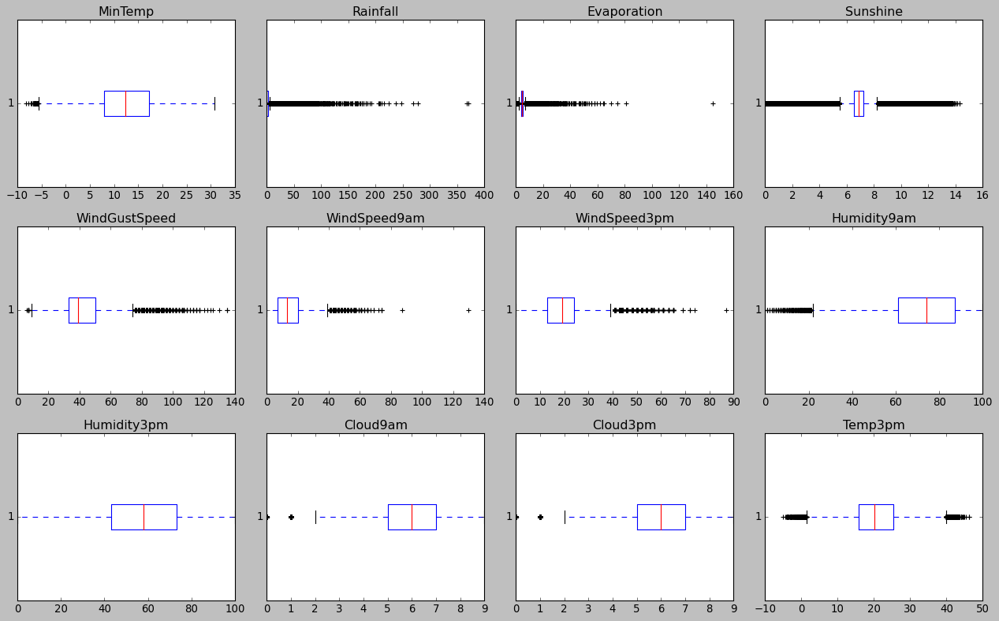

In [61]:
# Boxplot untuk Data Numerikal 
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(16, 10))
for i, var in enumerate(numerical):
    row = i // 4
    col = i % 4
    ax[row, col].boxplot(df3[var], vert=False)
    ax[row, col].set_title(var)

plt.tight_layout()
plt.show()

On closer inspection, we can see that the `Rainfall`, `Evaporation`, `WindSpeed9am` and `WindSpeed3pm` columns may contain outliers.

Text(0, 0.5, 'WindSpeed3pm')

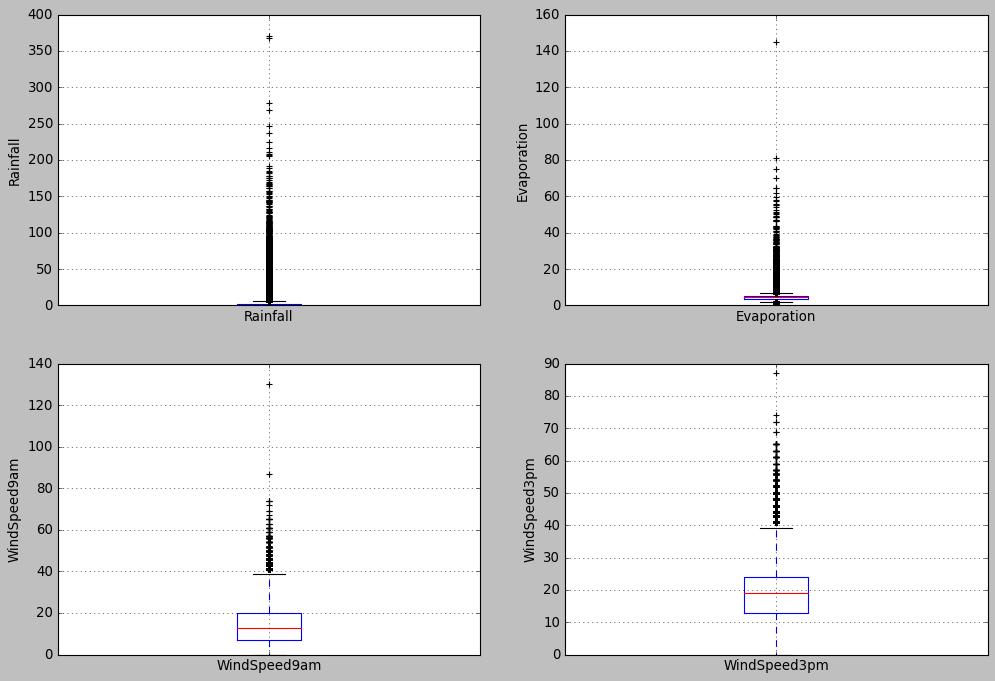

In [62]:
# draw boxplots to visualize outliers

plt.figure(figsize=(15,10))

plt.subplot(2, 2, 1)
fig = df3.boxplot(column='Rainfall')
fig.set_title('')
fig.set_ylabel('Rainfall')


plt.subplot(2, 2, 2)
fig = df3.boxplot(column='Evaporation')
fig.set_title('')
fig.set_ylabel('Evaporation')


plt.subplot(2, 2, 3)
fig = df3.boxplot(column='WindSpeed9am')
fig.set_title('')
fig.set_ylabel('WindSpeed9am')


plt.subplot(2, 2, 4)
fig = df3.boxplot(column='WindSpeed3pm')
fig.set_title('')
fig.set_ylabel('WindSpeed3pm')

    The above boxplots confirm that there are lot of outliers in these variables.

In [63]:
# find outliers for Rainfall variable
IQR = df3.Rainfall.quantile(0.75) - df3.Rainfall.quantile(0.25)
Lower_fence = df3.Rainfall.quantile(0.25) - (IQR * 3)
Upper_fence = df3.Rainfall.quantile(0.75) + (IQR * 3)
print('Rainfall outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))
print('For Rainfall, the minimum and maximum values are 0.0 and 371.0. So, the outliers are values > {upperboundary}'.format(upperboundary=Upper_fence))

Rainfall outliers are values < -6.6000000000000005 or > 8.8
For Rainfall, the minimum and maximum values are 0.0 and 371.0. So, the outliers are values > 8.8


In [64]:
# find outliers for Evaporation variable
IQR = df3.Evaporation.quantile(0.75) - df3.Evaporation.quantile(0.25)
Lower_fence = df3.Evaporation.quantile(0.25) - (IQR * 3)
Upper_fence = df3.Evaporation.quantile(0.75) + (IQR * 3)
print('Evaporation outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))
print('For Evaporation, the minimum and maximum values are 0.0 and 145.0. So, the outliers are values > {upperboundary}'.format(upperboundary=Upper_fence))

Evaporation outliers are values < 0.1999999999999993 or > 8.600000000000001
For Evaporation, the minimum and maximum values are 0.0 and 145.0. So, the outliers are values > 8.600000000000001


In [65]:
# find outliers for WindSpeed9am variable

IQR = df3.WindSpeed9am.quantile(0.75) - df3.WindSpeed9am.quantile(0.25)
Lower_fence = df3.WindSpeed9am.quantile(0.25) - (IQR * 3)
Upper_fence = df3.WindSpeed9am.quantile(0.75) + (IQR * 3)
print('WindSpeed9am outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))
print('For WindSpeed9am, the minimum and maximum values are 0.0 and 130.0. So, the outliers are values > {upperboundary}'.format(upperboundary=Upper_fence))

WindSpeed9am outliers are values < -32.0 or > 59.0
For WindSpeed9am, the minimum and maximum values are 0.0 and 130.0. So, the outliers are values > 59.0


In [66]:
# find outliers for WindSpeed3pm variable

IQR = df3.WindSpeed3pm.quantile(0.75) - df3.WindSpeed3pm.quantile(0.25)
Lower_fence = df3.WindSpeed3pm.quantile(0.25) - (IQR * 3)
Upper_fence = df3.WindSpeed3pm.quantile(0.75) + (IQR * 3)
print('WindSpeed3pm outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))
print('For WindSpeed3pm, the minimum and maximum values are 0.0 and 87.0. So, the outliers are values > {upperboundary}'.format(upperboundary=Upper_fence))

WindSpeed3pm outliers are values < -20.0 or > 57.0
For WindSpeed3pm, the minimum and maximum values are 0.0 and 87.0. So, the outliers are values > 57.0


### Encode - Label Encoder

In [67]:
# Melihat kolom RainTomorrow
df3['RainTomorrow']

2          No
4          No
5          No
8         Yes
10        Yes
         ... 
145436     No
145445     No
145453     No
145457     No
145458     No
Name: RainTomorrow, Length: 62874, dtype: object

In [68]:
# Membuat Objek LabelEncoder untuk Data Kategorikal
label_encoder = preprocessing.LabelEncoder() 

In [69]:
# Mengkodekan dan mencetak nilai kategorikal pada kolom "RainToday" 
df3['RainToday']= label_encoder.fit_transform(df3['RainToday'])

print("list of RainToday: ")
for i, item in enumerate(label_encoder.classes_):
    print(item, "-->", i)

list of RainToday: 
No --> 0
Yes --> 1


In [70]:
# Mengkodekan dan mencetak nilai kategorikal pada kolom "RainTomorrow" 
df3['RainTomorrow']= label_encoder.fit_transform(df3['RainTomorrow'])

print("list of RainTomorrow: ")
for i, item in enumerate(label_encoder.classes_):
    print(item, "-->", i)

list of RainTomorrow: 
No --> 0
Yes --> 1


In [71]:
# Melihat kolom RainTomorrow setelah encode
df3['RainTomorrow']

2         0
4         0
5         0
8         1
10        1
         ..
145436    0
145445    0
145453    0
145457    0
145458    0
Name: RainTomorrow, Length: 62874, dtype: int32

### Encode - One Hot Encoding

In [72]:
# find categorical variables
categoric = [var for var in df3.columns if df3[var].dtype=='O']

print('There are {} categorical variables\n'.format(len(categoric)))

print('The categorical variables are :', categoric)

There are 4 categorical variables

The categorical variables are : ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']


In [73]:
# Menerapkan One Hot Encoding pada Variabel kategorik 
df4 = pd.get_dummies(df3, columns=["Location", "WindGustDir", "WindDir9am", "WindDir3pm"], 
                            prefix=["loc", "windgust", "winddir9am", "winddir3pm"], 
                            drop_first=True)
df4

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow,Day,Month,Year,loc_Albany,loc_Albury,loc_AliceSprings,loc_BadgerysCreek,loc_Ballarat,loc_Bendigo,loc_Brisbane,loc_Cairns,loc_Canberra,loc_Cobar,loc_CoffsHarbour,loc_Dartmoor,loc_Darwin,loc_GoldCoast,loc_Hobart,loc_Katherine,loc_Launceston,loc_Melbourne,loc_MelbourneAirport,loc_Mildura,loc_Moree,loc_MountGambier,loc_MountGinini,loc_Newcastle,loc_Nhil,loc_NorahHead,loc_NorfolkIsland,loc_Nuriootpa,loc_PearceRAAF,loc_Penrith,loc_Perth,loc_PerthAirport,loc_Portland,loc_Richmond,loc_Sale,loc_SalmonGums,loc_Sydney,loc_SydneyAirport,loc_Townsville,loc_Tuggeranong,loc_Uluru,loc_WaggaWagga,loc_Walpole,loc_Watsonia,loc_Williamtown,loc_Witchcliffe,loc_Wollongong,loc_Woomera,windgust_ENE,windgust_ESE,windgust_N,windgust_NE,windgust_NNE,windgust_NNW,windgust_NW,windgust_S,windgust_SE,windgust_SSE,windgust_SSW,windgust_SW,windgust_W,windgust_WNW,windgust_WSW,winddir9am_ENE,winddir9am_ESE,winddir9am_N,winddir9am_NE,winddir9am_NNE,winddir9am_NNW,winddir9am_NW,winddir9am_S,winddir9am_SE,winddir9am_SSE,winddir9am_SSW,winddir9am_SW,winddir9am_W,winddir9am_WNW,winddir9am_WSW,winddir3pm_ENE,winddir3pm_ESE,winddir3pm_N,winddir3pm_NE,winddir3pm_NNE,winddir3pm_NNW,winddir3pm_NW,winddir3pm_S,winddir3pm_SE,winddir3pm_SSE,winddir3pm_SSW,winddir3pm_SW,winddir3pm_W,winddir3pm_WNW,winddir3pm_WSW
2,12.9,0.0,4.4,6.9,46.0,19.0,26.0,38.0,30.0,6.0,2.0,23.2,0,0,3,12,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,17.5,1.0,4.4,6.9,41.0,7.0,20.0,82.0,33.0,7.0,8.0,29.7,0,0,5,12,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
5,14.6,0.2,4.4,6.9,56.0,19.0,24.0,55.0,23.0,6.0,6.0,28.9,0,0,6,12,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
8,9.7,0.0,4.4,6.9,80.0,7.0,28.0,42.0,9.0,6.0,6.0,30.2,0,1,9,12,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
10,13.4,0.0,4.4,6.9,30.0,17.0,6.0,48.0,22.0,6.0,6.0,28.8,0,1,11,12,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145436,1.5,0.0,4.4,6.9,37.0,17.0,22.0,45.0,18.0,6.0,6.0,17.6,0,0,2,6,2017,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
145445,2.4,0.0,4.4,6.9,33.0,17.0,17.0,59.0,24.0,6.0,6.0,18.8,0,0,11,6,2017,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
145453,7.4,0.0,4.4,6.9,35.0,15.0,17.0,63.0,33.0,6.0,6.0,20.3,0,0,19,6,2017,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
145457,5.4,0.0,4.4,6.9,37.0,9.0,9.0,53.0,24.0,6.0,6.0,

In [74]:
# mengambil 5 sample
df4.sample(5)

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow,Day,Month,Year,loc_Albany,loc_Albury,loc_AliceSprings,loc_BadgerysCreek,loc_Ballarat,loc_Bendigo,loc_Brisbane,loc_Cairns,loc_Canberra,loc_Cobar,loc_CoffsHarbour,loc_Dartmoor,loc_Darwin,loc_GoldCoast,loc_Hobart,loc_Katherine,loc_Launceston,loc_Melbourne,loc_MelbourneAirport,loc_Mildura,loc_Moree,loc_MountGambier,loc_MountGinini,loc_Newcastle,loc_Nhil,loc_NorahHead,loc_NorfolkIsland,loc_Nuriootpa,loc_PearceRAAF,loc_Penrith,loc_Perth,loc_PerthAirport,loc_Portland,loc_Richmond,loc_Sale,loc_SalmonGums,loc_Sydney,loc_SydneyAirport,loc_Townsville,loc_Tuggeranong,loc_Uluru,loc_WaggaWagga,loc_Walpole,loc_Watsonia,loc_Williamtown,loc_Witchcliffe,loc_Wollongong,loc_Woomera,windgust_ENE,windgust_ESE,windgust_N,windgust_NE,windgust_NNE,windgust_NNW,windgust_NW,windgust_S,windgust_SE,windgust_SSE,windgust_SSW,windgust_SW,windgust_W,windgust_WNW,windgust_WSW,winddir9am_ENE,winddir9am_ESE,winddir9am_N,winddir9am_NE,winddir9am_NNE,winddir9am_NNW,winddir9am_NW,winddir9am_S,winddir9am_SE,winddir9am_SSE,winddir9am_SSW,winddir9am_SW,winddir9am_W,winddir9am_WNW,winddir9am_WSW,winddir3pm_ENE,winddir3pm_ESE,winddir3pm_N,winddir3pm_NE,winddir3pm_NNE,winddir3pm_NNW,winddir3pm_NW,winddir3pm_S,winddir3pm_SE,winddir3pm_SSE,winddir3pm_SSW,winddir3pm_SW,winddir3pm_W,winddir3pm_WNW,winddir3pm_WSW
108267,4.3,0.0,5.4,6.9,28.0,15.0,11.0,57.0,17.0,1.0,6.0,16.8,0,0,26,8,2016,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
134801,8.7,0.0,4.4,6.9,52.0,4.0,30.0,64.0,62.0,6.0,6.0,19.2,0,0,3,1,2014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
104502,4.5,10.0,2.9,8.4,69.0,28.0,30.0,67.0,58.0,4.0,6.0,9.0,1,1,1,8,2014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
123868,12.6,0.0,4.4,6.9,44.0,20.0,24.0,61.0,58.0,6.0,6.0,20.6,0,0,7,2,2009,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
16675,11.7,0.2,4.4,6.9,39.0,0.0,4.0,97.0,56.0,8.0,5.0,20.4,0,0,16,7,2013,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


    Kode di atas akan menghasilkan dataframe baru dengan kolom-kolom hasil dari One Hot Encoding pada variabel Location, WindGustDir, WindDir9am, dan WindDir3pm. 

    Fungsi pd.get_dummies() akan menghasilkan kolom dummy untuk setiap kategori unik pada variabel kategorikal yang dipilih. Dalam hal ini, parameter columns digunakan untuk memilih variabel yang akan di-encode.

    Parameter prefix digunakan untuk memberi awalan pada nama kolom dummy. 

    Parameter drop_first digunakan untuk menghindari jebakan dummy.

In [75]:
# melihat type kolom
df4.dtypes

MinTemp           float64
Rainfall          float64
Evaporation       float64
Sunshine          float64
WindGustSpeed     float64
                   ...   
winddir3pm_SSW      uint8
winddir3pm_SW       uint8
winddir3pm_W        uint8
winddir3pm_WNW      uint8
winddir3pm_WSW      uint8
Length: 110, dtype: object

### Feature Selection

In [76]:
# split X and y
X = df4.drop(['RainTomorrow'], axis=1)
y = df4['RainTomorrow']
print(X.shape)
print(y.shape)

(62874, 109)
(62874,)


In [77]:
#splitting data into  20% data test dan 80% data train
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=42, test_size=0.2)

In [78]:
# check data types in X_train
X_train.dtypes

MinTemp           float64
Rainfall          float64
Evaporation       float64
Sunshine          float64
WindGustSpeed     float64
                   ...   
winddir3pm_SSW      uint8
winddir3pm_SW       uint8
winddir3pm_W        uint8
winddir3pm_WNW      uint8
winddir3pm_WSW      uint8
Length: 109, dtype: object

In [79]:
# Memperbarui list atribut bertipe kategorik
categorical = [i for i in X_train.columns if i not in numerical]

# Memperbarui list atribut bertipe numerik
numerical = [i for i in X_train.columns if i not in categorical]
print('categorical:', categorical, '\n', '\n', 'numerical: ', numerical)

categorical: ['RainToday', 'Day', 'Month', 'Year', 'loc_Albany', 'loc_Albury', 'loc_AliceSprings', 'loc_BadgerysCreek', 'loc_Ballarat', 'loc_Bendigo', 'loc_Brisbane', 'loc_Cairns', 'loc_Canberra', 'loc_Cobar', 'loc_CoffsHarbour', 'loc_Dartmoor', 'loc_Darwin', 'loc_GoldCoast', 'loc_Hobart', 'loc_Katherine', 'loc_Launceston', 'loc_Melbourne', 'loc_MelbourneAirport', 'loc_Mildura', 'loc_Moree', 'loc_MountGambier', 'loc_MountGinini', 'loc_Newcastle', 'loc_Nhil', 'loc_NorahHead', 'loc_NorfolkIsland', 'loc_Nuriootpa', 'loc_PearceRAAF', 'loc_Penrith', 'loc_Perth', 'loc_PerthAirport', 'loc_Portland', 'loc_Richmond', 'loc_Sale', 'loc_SalmonGums', 'loc_Sydney', 'loc_SydneyAirport', 'loc_Townsville', 'loc_Tuggeranong', 'loc_Uluru', 'loc_WaggaWagga', 'loc_Walpole', 'loc_Watsonia', 'loc_Williamtown', 'loc_Witchcliffe', 'loc_Wollongong', 'loc_Woomera', 'windgust_ENE', 'windgust_ESE', 'windgust_N', 'windgust_NE', 'windgust_NNE', 'windgust_NNW', 'windgust_NW', 'windgust_S', 'windgust_SE', 'windgust_SS

### Engineering outliers in numerical variables
We have seen that the `Rainfall`, `Evaporation`, `WindSpeed9am` and `WindSpeed3pm` columns contain outliers. We will use top-coding approach to cap maximum values and remove outliers from the above variables.

In [80]:
# Membatasi Nilai Maksimum pada Beberapa Variabel pada Data Frame menggunakan Fungsi 'max_value'
def max_value(df4, variable, top):
    return np.where(df4[variable]>top, top, df4[variable])

for df4 in [X_train, X_test]:
    df4['Rainfall'] = max_value(df4, 'Rainfall', 8.8)
    df4['Evaporation'] = max_value(df4, 'Evaporation', 8.6)
    df4['WindSpeed9am'] = max_value(df4, 'WindSpeed9am', 59)
    df4['WindSpeed3pm'] = max_value(df4, 'WindSpeed3pm', 57)

In [81]:
# Menampilkan Nilai Maksimum Kolom Rainfall pada Dataframe X_train dan X_test
X_train.Rainfall.max(), X_test.Rainfall.max()

(8.8, 8.8)

In [82]:
# Menampilkan Nilai Maksimum Kolom Evaporation pada Dataframe X_train dan X_test
X_train.Evaporation.max(), X_test.Evaporation.max()

(8.6, 8.6)

In [83]:
# Menampilkan Nilai Maksimum Kolom WindSpeed9am pada Dataframe X_train dan X_test
X_train.WindSpeed9am.max(), X_test.WindSpeed9am.max()

(59.0, 59.0)

In [84]:
# Menampilkan Nilai Maksimum Kolom WindSpeed3pm pada Dataframe X_train dan X_test
X_train.WindSpeed3pm.max(), X_test.WindSpeed3pm.max()

(57.0, 57.0)

In [85]:
# statistik deskriptif dari variabel numerik pada dataframe X_train
X_train[numerical].describe()

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Temp3pm
count,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000
mean,12.535372,1.825400,4.544502,6.691028,41.835404,14.499811,19.134973,72.028589,57.560369,5.385853,5.497903,20.809978
std,6.379104,3.074727,1.968099,2.880266,14.192373,9.147093,9.097838,18.523950,21.546099,2.261088,2.092224,6.862710
min,-8.200000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5.100000
25%,8.000000,0.000000,3.800000,6.500000,31.000000,7.000000,13.000000,61.000000,43.000000,5.000000,5.000000,15.800000
50%,12.300000,0.000000,4.400000,6.900000,39.000000,13.000000,19.000000,74.000000,58.000000,6.000000,6.000000,20.100000
75%,17.200000,2.200000,5.000000,7.200000,50.000000,20.000000,24.000000,87.000000,73.000000,7.000000,7.000000,25.400000
max,30.700000,8.800000,8.600000,14.300000,135.000000,59.000000,57.000000,100.000000,100.000000,9.000000,8.000000,46.100000


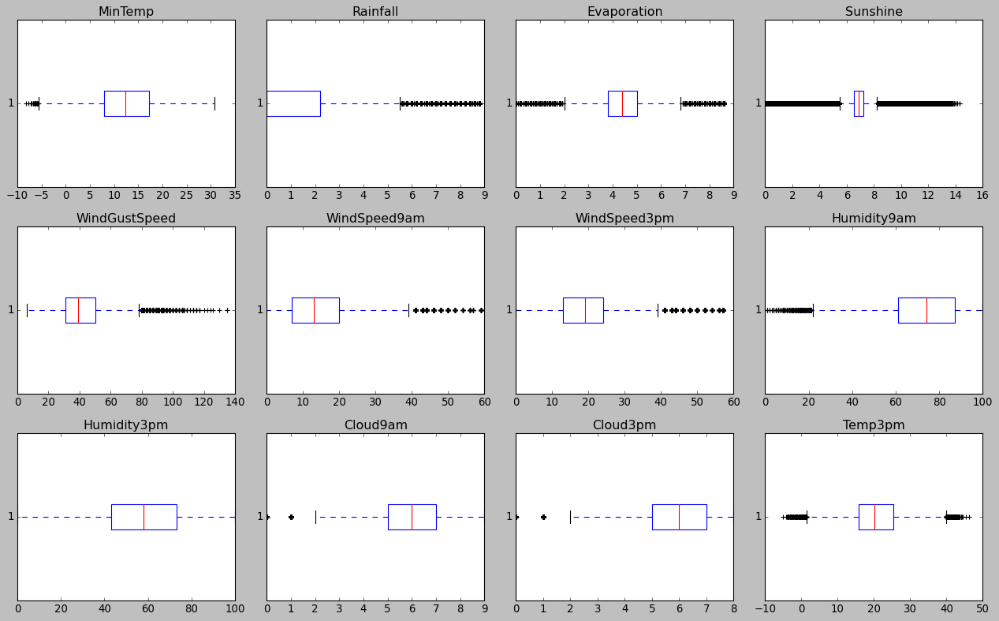

In [86]:
# Boxplot untuk Data Numerikal 
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(16, 10))
for i, var in enumerate(numerical):
    row = i // 4
    col = i % 4
    ax[row, col].boxplot(X_train[var], vert=False)
    ax[row, col].set_title(var)

plt.tight_layout()
plt.show()

Kita sekarang dapat melihat bahwa outlier di kolom `Rainfall`, `Evaporation`, `WindSpeed9am` dan `WindSpeed3pm` capped/dibatasi.

### Feature Scaling

In [87]:
# statistik deskriptif pada X_train
X_train.describe()

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,Day,Month,Year,loc_Albany,loc_Albury,loc_AliceSprings,loc_BadgerysCreek,loc_Ballarat,loc_Bendigo,loc_Brisbane,loc_Cairns,loc_Canberra,loc_Cobar,loc_CoffsHarbour,loc_Dartmoor,loc_Darwin,loc_GoldCoast,loc_Hobart,loc_Katherine,loc_Launceston,loc_Melbourne,loc_MelbourneAirport,loc_Mildura,loc_Moree,loc_MountGambier,loc_MountGinini,loc_Newcastle,loc_Nhil,loc_NorahHead,loc_NorfolkIsland,loc_Nuriootpa,loc_PearceRAAF,loc_Penrith,loc_Perth,loc_PerthAirport,loc_Portland,loc_Richmond,loc_Sale,loc_SalmonGums,loc_Sydney,loc_SydneyAirport,loc_Townsville,loc_Tuggeranong,loc_Uluru,loc_WaggaWagga,loc_Walpole,loc_Watsonia,loc_Williamtown,loc_Witchcliffe,loc_Wollongong,loc_Woomera,windgust_ENE,windgust_ESE,windgust_N,windgust_NE,windgust_NNE,windgust_NNW,windgust_NW,windgust_S,windgust_SE,windgust_SSE,windgust_SSW,windgust_SW,windgust_W,windgust_WNW,windgust_WSW,winddir9am_ENE,winddir9am_ESE,winddir9am_N,winddir9am_NE,winddir9am_NNE,winddir9am_NNW,winddir9am_NW,winddir9am_S,winddir9am_SE,winddir9am_SSE,winddir9am_SSW,winddir9am_SW,winddir9am_W,winddir9am_WNW,winddir9am_WSW,winddir3pm_ENE,winddir3pm_ESE,winddir3pm_N,winddir3pm_NE,winddir3pm_NNE,winddir3pm_NNW,winddir3pm_NW,winddir3pm_S,winddir3pm_SE,winddir3pm_SSE,winddir3pm_SSW,winddir3pm_SW,winddir3pm_W,winddir3pm_WNW,winddir3pm_WSW
count,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.00000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.00000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000,50299.000000
mean,12.535372,1.825400,4.544502,6.691028,41.835404,14.499811,19.134973,72.028589,57.560369,5.385853,5.497903,20.809978,0.308098,15.719756,6.423050,2012.733573,0.024116,0.021114,0.016700,0.019762,0.022446,0.020478,0.022565,0.024672,0.022267,0.018211,0.023102,0.023579,0.023778,0.022148,0.023678,0.010378,0.022247,0.017138,0.020875,0.016800,0.016541,0.023837,0.021213,0.020736,0.010318,0.021829,0.024672,0.020637,0.016839,0.019742,0.022068,0.019901,0.026303,0.019106,0.021213,0.018489,0.024533,0.022943,0.019225,0.019941,0.00833,0.020318,0.023241,0.022088,0.017217,0.024195,0.021332,0.016084,0.050180,0.045468,0.068371,0.047496,0.044812,0.051472,0.061015,0.061870,0.062268,0.062049,0.061095,0.059961,0.141633,0.060180,0.064136,0.050498,0.046880,0.154655,0.052426,0.059166,0.062665,0.065369,0.057615,0.057934,0.05849,0.051631,0.058192,0.062248,0.054912,0.050001,0.050021,0.055448,0.065369,0.054932,0.047397,0.058550,0.065150,0.067993,0.071572,0.061134,0.055528,0.060140,0.101612,0.065926,0.065707
std,6.379104,3.074727,1.968099,2.880266,14.192373,9.147093,9.097838,18.523950,21.546099,2.261088,2.092224,6.862710,0.461712,8.817100,3.385262,2.544684,0.153410

In [88]:
# Membuat variabel baru
cols = X_train.columns

In [89]:
# Menerapkan Standard Scaler pada Data Train
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_train

array([[-0.58556967, -0.46359048, -0.07342278, ..., -0.33631124,
        -0.26566656, -0.26519451],
       [ 0.41771606, -0.59368462,  1.95901517, ..., -0.33631124,
        -0.26566656, -0.26519451],
       [ 0.13554195, -0.59368462, -0.07342278, ..., -0.33631124,
        -0.26566656, -0.26519451],
       ...,
       [-0.17798484, -0.39854342, -0.07342278, ..., -0.33631124,
        -0.26566656, -0.26519451],
       [ 1.21720937, -0.59368462,  1.75577137, ..., -0.33631124,
        -0.26566656, -0.26519451],
       [-0.64827503, -0.59368462, -1.59775123, ..., -0.33631124,
        -0.26566656, -0.26519451]])

In [90]:
# Menerapkan Standard Scaler pada Data Test
X_test = scaler.transform(X_test)
X_test

array([[ 1.23288571, -0.59368462, -1.29288554, ..., -0.33631124,
        -0.26566656, -0.26519451],
       [-0.61692235, -0.59368462, -0.58153226, ..., -0.33631124,
        -0.26566656, -0.26519451],
       [ 1.07612231, -0.39854342,  0.43468671, ..., -0.33631124,
        -0.26566656, -0.26519451],
       ...,
       [-0.30339556, -0.59368462,  0.7395524 , ..., -0.33631124,
        -0.26566656, -0.26519451],
       [ 1.34262008,  2.20333928,  1.24766189, ..., -0.33631124,
        -0.26566656, -0.26519451],
       [-1.65156075, -0.59368462, -0.98801985, ..., -0.33631124,
        -0.26566656,  3.77081716]])

In [91]:
# Mengubah Numpy Array menjadi Pandas DataFrame dengan Nama Kolom pada Data Training
cols_pca = ['PCA_1', 'PCA_2']

In [92]:
# Menggunakan teknik reduksi dimensi seperti PCA
pca = PCA(n_components=2)
X_train = pca.fit_transform(X_train)
X_train

array([[-1.00976463, -1.85426052],
       [ 0.79403433,  0.48329065],
       [-0.97185183,  0.06322622],
       ...,
       [-1.76709371, -1.7577359 ],
       [ 3.82378756,  0.96463983],
       [ 0.45875754, -1.08419052]])

In [93]:
# Menggunakan teknik reduksi dimensi seperti PCA
X_test = pca.transform(X_test)
X_test

array([[-1.10590941,  0.76252559],
       [ 2.82876474, -1.36444405],
       [ 0.90642003,  3.83139504],
       ...,
       [ 2.34098526,  0.46932272],
       [-1.73278564,  3.49719854],
       [ 0.36577572, -2.05196115]])

In [94]:
# Mengubah Numpy Array menjadi Pandas DataFrame dengan Nama Kolom pada Data Training
X_train = pd.DataFrame(X_train, columns=[cols_pca])
X_train

,PCA_1,PCA_2
0,-1.009765,-1.854261
1,0.794034,0.483291
2,-0.971852,0.063226
3,-0.811875,2.613973
4,2.002650,2.274750
...,...,...
50294,4.103851,0.467246
50295,-2.249525,4.804510
50296,-1.767094,-1.757736
50297,3.823788,0.964640


In [95]:
# Mengubah Numpy Array menjadi Pandas DataFrame dengan Nama Kolom pada Data Training
X_test = pd.DataFrame(X_test, columns=[cols_pca])
X_test

,PCA_1,PCA_2
0,-1.105909,0.762526
1,2.828765,-1.364444
2,0.906420,3.831395
3,-2.650999,-0.383384
4,4.249676,1.717048
...,...,...
12570,1.301099,-2.317873
12571,1.432422,1.671580
12572,2.340985,0.469323
12573,-1.732786,3.497199


In [96]:
# melihat kembali statistik deskriptif pada X_train
X_train.describe()

,PCA_1,PCA_2
count,5.029900e+04,5.029900e+04
mean,-2.184733e-17,-1.762487e-16
std,2.101746e+00,1.713180e+00
min,-5.301469e+00,-4.834713e+00
25%,-1.543971e+00,-1.219583e+00
50%,-1.409910e-01,-1.387241e-01
75%,1.317375e+00,1.046924e+00
max,7.616857e+00,7.045546e+00


## LOGISTIC REGRESSION
Metode pengujian pada training ini menggunakan metode regresi logistik. Alasan penggunaan metode karena regresi logistik dapat dipakai untuk masalah klasifikasi biner. Model akan menghitung probabilitas data masing-masing kelas kemudian membuat keputusan akhir dengan mengambil probabilitas tertinggi.

### Pendefinisian Model
Bagian ini berisi cell untuk mendefinisikan model sampai kompilasi model.Akan lebih bagus jika didahului dengan penjelasan mengapa memilih arsitektur atau jenis model tertentu, alasan memilih nilai hyperparameter, dan hal lain yang berkaitan.

In [97]:
# bulding Logistic Regression Model
model_lr = LogisticRegression(C=1.0, solver='liblinear', random_state=0)
model_lr100 = LogisticRegression(C=100, solver='liblinear', random_state=0)
model_lr001 = LogisticRegression(C=0.01, solver='liblinear', random_state=0)

    Model model_lr memiliki nilai C=1.0 yang menandakan regularisasi yang standar.

    Model model_lr100 memiliki nilai C=100 yang menandakan regularisasi yang lebih lemah. Artinya, model ini akan mencoba untuk memfitting data dengan baik tanpa terlalu mempertimbangkan regularisasi.

    Model model_lr001 memiliki nilai C=0.01 yang menandakan regularisasi yang lebih kuat. Artinya, model ini akan lebih mempertimbangkan regularisasi dalam proses fitting data.

    Semakin besar nilai C, maka semakin kecil pengaruh dari regularisasi dalam fitting data, dan semakin kecil nilai C, maka semakin besar pengaruh dari regularisasi dalam fitting data. Pemilihan nilai C ini bergantung pada kompleksitas data dan performa model yang diinginkan.

### Pelatihan Model
Cell pada bagian ini hanya berisi code untuk melatih model dan output yang dihasilkan.

#### C=1.0

In [98]:
# fitting Logistic Regression Model
model_lr.fit(X_train, y_train)

LogisticRegression(random_state=0, solver='liblinear')

In [99]:
#check for accuracy Logistic Regression model with train & test data
print("Train score:", model_lr.score(X_train, y_train))
print("Test score:", model_lr.score(X_test, y_test))

Train score: 0.7171514344221556
Test score: 0.70831013916501


    Dari hasil pelatihan dengan model Regresi Logistik (LR), didapatkan nilai akurasi sebesar 0.7172 pada train set dan 0.7083 pada test set. Nilai tersebut menunjukkan bahwa model LR memiliki performa yang cukup baik dalam memprediksi apakah besok akan turun hujan atau tidak berdasarkan fitur-fitur yang ada.

In [100]:
# Applying 5-Fold Cross Validation
scores = cross_val_score(model_lr, X_train, y_train, cv = 5, scoring='accuracy')

# compute cross-validation score
print('Cross-validation scores:{}'.format(scores))

# compute Average cross-validation score
print('Average cross-validation score: {:.4f}'.format(scores.mean()))

Cross-validation scores:[0.71043738 0.71779324 0.71739563 0.72276342 0.71816284]
Average cross-validation score: 0.7173


    Berdasarkan hasil cross-validation score, didapatkan rata-rata score sebesar 0.7173, yang berarti model memiliki kinerja yang stabil dalam memprediksi target variable 'RainTomorrow'. 

#### C=100

In [101]:
# fitting Logistic Regression Model
model_lr100.fit(X_train, y_train)

LogisticRegression(C=100, random_state=0, solver='liblinear')

In [102]:
#check for accuracy Logistic Regression model withtrain & test data
print("Train score:", model_lr100.score(X_train, y_train))
print("Test score:", model_lr100.score(X_test, y_test))

Train score: 0.7171514344221556
Test score: 0.70831013916501


    Dari hasil pelatihan dengan model Regresi Logistik (LR), didapatkan nilai akurasi sebesar 0.7172 pada train set dan 0.7083 pada test set. Nilai tersebut menunjukkan bahwa model LR memiliki performa yang cukup baik dalam memprediksi apakah besok akan turun hujan atau tidak berdasarkan fitur-fitur yang ada.

In [103]:
# Applying 5-Fold Cross Validation
scores100 = cross_val_score(model_lr100, X_train, y_train, cv = 5, scoring='accuracy')

# compute cross-validation score
print('Cross-validation scores:{}'.format(scores100))

# compute Average cross-validation score
print('Average cross-validation score: {:.4f}'.format(scores100.mean()))

Cross-validation scores:[0.71043738 0.71779324 0.71739563 0.72276342 0.71816284]
Average cross-validation score: 0.7173


    Berdasarkan hasil cross-validation score, didapatkan rata-rata score sebesar 0.7173, yang berarti model memiliki kinerja yang stabil dalam memprediksi target variable 'RainTomorrow'. 

#### C=0.1

In [104]:
# fitting Logistic Regression Model
model_lr001.fit(X_train, y_train)

LogisticRegression(C=0.01, random_state=0, solver='liblinear')

In [105]:
#check for accuracy Logistic Regression model withtrain & test data
print("Train score:", model_lr001.score(X_train, y_train))
print("Test score:", model_lr001.score(X_test, y_test))

Train score: 0.7171514344221556
Test score: 0.708389662027833


    Dari hasil pelatihan dengan model Regresi Logistik (LR), didapatkan nilai akurasi sebesar 0.7172 pada train set dan 0.7083 pada test set. Nilai tersebut menunjukkan bahwa model LR memiliki performa yang cukup baik dalam memprediksi apakah besok akan turun hujan atau tidak berdasarkan fitur-fitur yang ada.

In [106]:
# Applying 5-Fold Cross Validation
scores001 = cross_val_score(model_lr001, X_train, y_train, cv = 5, scoring='accuracy')

# compute cross-validation score
print('Cross-validation scores:{}'.format(scores001))

# compute Average cross-validation score
print('Average cross-validation score: {:.4f}'.format(scores001.mean()))

Cross-validation scores:[0.71053678 0.71769384 0.71729622 0.72286282 0.71846108]
Average cross-validation score: 0.7174


    Berdasarkan hasil cross-validation score, didapatkan rata-rata score sebesar 0.7174, yang berarti model memiliki kinerja yang stabil dalam memprediksi target variable 'RainTomorrow'. 

**Analisis** :
Ketiga model memiliki nilai rata-rata cross-validation yang sama (0.7173), namun model_lr001 memiliki nilai test score yang sedikit lebih tinggi dibandingkan dengan model_lr dan model_lr100. Oleh karena itu, model_lr001 bisa dikatakan lebih baik dan menghasilkan score yang bagus dan pas.

### Evaluasi Model
Pada bagian ini, dilakukan evaluasi model yang harus menunjukkan bagaimana performa model berdasarkan metrics yang dipilih. Hal ini harus dibuktikan dengan visualisasi tren performa dan/atau tingkat kesalahan model.

In [107]:
#check for predict test LR Model
y_pred_lr = model_lr.predict(X_test)
y_pred_lr

array([1, 0, 1, ..., 0, 1, 0])

**predict_proba** method gives the probabilities for the target variable(0 and 1) in this case, in array form.

`0 is for probability of no rain` and `1 is for probability of rain.`

In [108]:
# probability of getting output as 0 - no rain
model_lr.predict_proba(X_test)[:,0]

array([0.30926741, 0.88264743, 0.37126544, ..., 0.77338121, 0.12728538,
       0.69383507])

In [109]:
# probability of getting output as 1 - rain
model_lr.predict_proba(X_test)[:,1]

array([0.69073259, 0.11735257, 0.62873456, ..., 0.22661879, 0.87271462,
       0.30616493])

In [110]:
#check for accuracy score test set LR Model
acc_lr = accuracy_score(y_test, y_pred_lr)
print('Accuracy score Test - Model LR: {0:0.4f}'. format(acc_lr))

Accuracy score Test - Model LR: 0.7083


In [111]:
#check for confusion matrix LR Model
matrix_lr = confusion_matrix(y_test, y_pred_lr)
print('Confusion matrix\n', matrix_lr)

print('\nTrue Positives(TP) = ', matrix_lr[0,0])

print('\nTrue Negatives(TN) = ', matrix_lr[1,1])

print('\nFalse Positives(FP) = ', matrix_lr[0,1])

print('\nFalse Negatives(FN) = ', matrix_lr[1,0])

Confusion matrix
 [[4529 1743]
 [1925 4378]]

True Positives(TP) =  4529

True Negatives(TN) =  4378

False Positives(FP) =  1743

False Negatives(FN) =  1925


<AxesSubplot:>

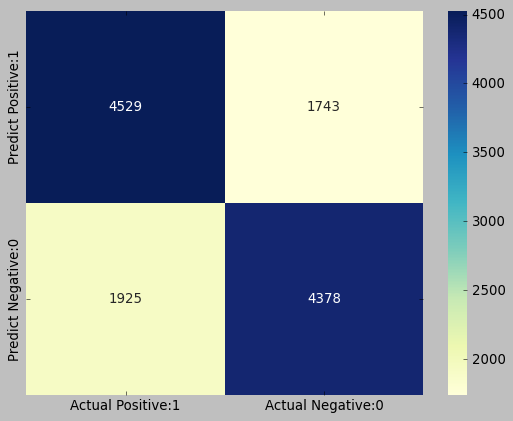

In [112]:
# visualize confusion matrix with seaborn heatmap
matrix_lr = pd.DataFrame(data=matrix_lr, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(matrix_lr, annot=True, fmt='d', cmap='YlGnBu')

confusion matrix diatas menunjukkan `4529 + 4378 = 8907 prediksi benar` and `1743 + 1925 = 3668 prediksi salah`.

In this case, we have
- `True Positives` (Actual Positive:1 and Predict Positive:1) - 4529

- `True Negatives` (Actual Negative:0 and Predict Negative:0) - 4378

- `False Positives` (Actual Negative:0 but Predict Positive:1) - 1743 `(Type I error)`

- `False Negatives` (Actual Positive:1 but Predict Negative:0) - 1925 `(Type II error)`

In [113]:
#Metrics Performance for Logistic Regression Model
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.70      0.72      0.71      6272
           1       0.72      0.69      0.70      6303

    accuracy                           0.71     12575
   macro avg       0.71      0.71      0.71     12575
weighted avg       0.71      0.71      0.71     12575



In [114]:
print('Ringkasan Evaluasi Model LR')
print('Akurasi : {0:0.4f}'. format(acc_lr))
print('Presisi : {0:0.4f}'. format(precision_score(y_test,y_pred_lr)))
print('Recall : {0:0.4f}'. format(recall_score(y_test,y_pred_lr)))
print('F1 Score : {0:0.4f}'. format(f1_score(y_test,y_pred_lr)))

Ringkasan Evaluasi Model LR
Akurasi : 0.7083
Presisi : 0.7152
Recall : 0.6946
F1 Score : 0.7048


Berdasarkan ringkasan evaluasi model logistic regression yang diberikan, dapat diambil kesimpulan sebagai berikut:
* Akurasi model adalah sebesar 0.7083, artinya model dapat memprediksi dengan benar sekitar 80,28% dari total data yang ada.
* Presisi model adalah sebesar 0.7152, artinya dari semua prediksi positif yang dilakukan oleh model, sekitar 71,52% di antaranya adalah benar positif.
* Recall model adalah sebesar 0.6946, artinya dari semua nilai aktual positif yang ada, model dapat mengidentifikasi sekitar 69,46% di antaranya sebagai hasil prediksi positif.
* F1 score model adalah sebesar 0.7048, yang merupakan harmonic mean antara precision dan recall. Semakin tinggi nilai F1 score, semakin baik pula kinerja model dalam melakukan prediksi.

In [115]:
# Adjusting the threshold level
# print the first 10 predicted probabilities of two classes- 0 and 1
y_pred_prob = model_lr.predict_proba(X_test)[0:10]

# store the probabilities in dataframe
y_pred_prob_df = pd.DataFrame(data=y_pred_prob, columns=['Prob of - No rain tomorrow (0)', 'Prob of - Rain tomorrow (1)'])
y_pred_prob_df

,Prob of - No rain tomorrow (0),Prob of - Rain tomorrow (1)
0,0.309267,0.690733
1,0.882647,0.117353
2,0.371265,0.628735
3,0.204953,0.795047
4,0.876163,0.123837
5,0.926480,0.073520
6,0.500200,0.499800
7,0.659813,0.340187
8,0.368389,0.631611
9,0.499304,0.500696


**Analisis :**
* Dari tabel tersebut, terdapat 10 data yang dianalisis dengan dua kemungkinan hasil yaitu hujan (1) dan tidak hujan (0). 
* Sebagai contoh, baris pertama menunjukkan bahwa probabilitas tidak hujan besok adalah 0,3092 dan probabilitas hujan besok adalah 0,6907.
* Probabilitas untuk tidak hujan (0) pada semua data berada di atas 20%, dengan nilai tertinggi mencapai 92.6% pada data ke-6. Hal ini menunjukkan bahwa kemungkinan besar besok tidak akan hujan. 
* Namun, pada beberapa data, terdapat probabilitas hujan yang cukup signifikan seperti pada data ke-1 yang memiliki probabilitas hujan mencapai 69.1%. 
* Oleh karena itu, perlu diperhatikan bahwa ada kemungkinan tidak terjadinya hujan pada beberapa data tersebut.
* Kesimpulan dari tabel tersebut adalah model memberikan estimasi probabilitas untuk setiap kelas dengan cukup baik

Text(0, 0.5, 'Frequency')

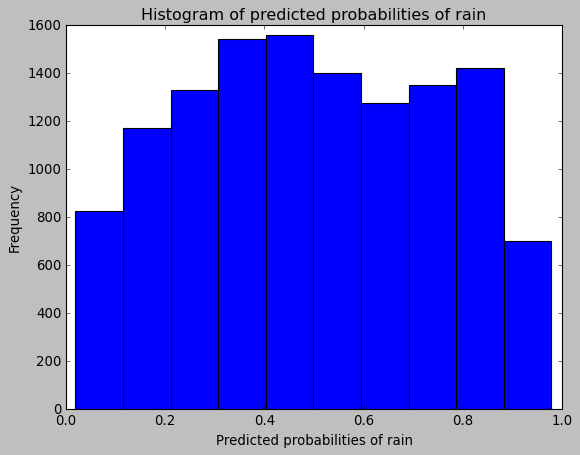

In [116]:
# plot histogram of predicted probabilities

# store the predicted probabilities for class 1 - Probability of rain
y_pred1 = model_lr.predict_proba(X_test)[:, 1]

# adjust the font size 
plt.rcParams['font.size'] = 12

# plot histogram with 10 bins
plt.hist(y_pred1, bins = 10)

# set the title of predicted probabilities
plt.title('Histogram of predicted probabilities of rain')

# set the x-axis limit
plt.xlim(0,1)

# set the title
plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')

    Analisis :
    * Kolom pertama memberi tahu kita bahwa ada sekitar 1580 pengamatan dengan probabilitas antara 0,3 dan 0,5.
    * Ada sejumlah kecil pengamatan dengan probabilitas > 0,5.
    * Jadi, sejumlah kecil pengamatan ini memperkirakan bahwa besok akan turun hujan.
    * Mayoritas pengamatan memperkirakan bahwa besok tidak akan ada turun hujan.

### Kesimpulan Model LR
1. Nilai akurasi model regresi logistik sebesar 0,7083. Jadi, model melakukan pekerjaan yang sangat baik dalam memprediksi apakah besok akan hujan atau tidak di Australia.
2. Pengamatan dalam jumlah kecil memperkirakan bahwa akan ada hujan besok. Mayoritas pengamatan memprediksi bahwa besok tidak akan turun hujan.
3. Model tidak menunjukkan tanda-tanda overfitting.
4. Peningkatan nilai C menghasilkan akurasi test set yang lebih tinggi dan akurasi training set yang sedikit meningkat. Jadi, kita dapat menyimpulkan bahwa model yang lebih kompleks akan bekerja lebih baik.
5. Confusion matrix menunjukkan 8.907 prediksi benar dan 3.668 prediksi salah
6. Skor model akurasi adalah 0,7083. Skor validasi silang rata-rata adalah 0,7173. Jadi, kita dapat menyimpulkan bahwa validasi silang tidak menghasilkan peningkatan kinerja.

## SUPORT VECTOR MACHINE (SVM)
Model kedua yakni model SVM. Model ini digunakan sebagai pembanding model regresi logistik. SVM dapat mengolah data berdimensi tinggi tanpa mengalami penurunan performa yang signifikan.

### Pendefinisian Model
Bagian ini berisi cell untuk mendefinisikan model sampai kompilasi model.Akan lebih bagus jika didahului dengan penjelasan mengapa memilih arsitektur atau jenis model tertentu, alasan memilih nilai hyperparameter, dan hal lain yang berkaitan.

    Kernel linear: Kernel ini membuat garis batas keputusan linear untuk memisahkan titik-titik data. Kernel ini cocok untuk data yang dapat dipisahkan secara linear.

In [117]:
# building SVM model
svm_model = LinearSVC()

### Pelatihan Model
Cell pada bagian ini hanya berisi code untuk melatih model dan output yang dihasilkan.

In [118]:
# fitting SVM Model
svm_model.fit(X_train, y_train)

LinearSVC()

In [119]:
#check for accuracy SVM model with train & test data
print("Train score:", svm_model.score(X_train, y_train))
print("Test score:", svm_model.score(X_test, y_test))

Train score: 0.7168532177578083
Test score: 0.7091053677932405


    Dari hasil pelatihan dengan model Suuport Vector Machine (SVM), didapatkan nilai akurasi sebesar 0.7169 pada train set dan 0.7091 pada test set. Nilai tersebut menunjukkan bahwa model SVM memiliki performa yang cukup baik dalam memprediksi apakah besok akan turun hujan atau tidak berdasarkan fitur-fitur yang ada.

In [120]:
# Applying 5-Fold Cross Validation
scores = cross_val_score(svm_model, X_train, y_train, cv = 5, scoring='accuracy')

# compute cross-validation score
print('Cross-validation scores:{}'.format(scores))

# compute Average cross-validation score
print('Average cross-validation score: {:.4f}'.format(scores.mean()))

Cross-validation scores:[0.71063618 0.71759443 0.71709742 0.72186879 0.71756636]
Average cross-validation score: 0.7170


    Berdasarkan hasil cross-validation score, didapatkan rata-rata score sebesar 0.7170, yang berarti model memiliki kinerja yang stabil dalam memprediksi target variable 'RainTomorrow'. 

### Evaluasi Model
Pada bagian ini, dilakukan evaluasi model yang harus menunjukkan bagaimana performa model berdasarkan metrics yang dipilih. Hal ini harus dibuktikan dengan visualisasi tren performa dan/atau tingkat kesalahan model.

In [121]:
#check for confusion matrix SVM Model
y_pred_svm = svm_model.predict(X_test)
y_pred_svm

array([1, 0, 1, ..., 0, 1, 0])

menggunakan fungsi keputusan pengklasifikasi dan menghitung probabilitas secara manual.

Metode decision_function mengembalikan nilai kontinu untuk setiap instance, dan probabilitas dihitung dengan menormalkan nilai ini ke rentang [0, 1].

`0 is for probability of no rain` and `1 is for probability of rain.`

In [122]:
# Nilai Keputusan untuk Model SVM
decision_values = svm_model.decision_function(X_test)
decision_values

array([ 0.32027404, -0.80068458,  0.2160372 , ..., -0.48454327,
        0.76922078, -0.32682492])

In [123]:
# Probabilitas Hasil Prediksi SVM pada Data Uji
probabilities = (decision_values - decision_values.min()) / (decision_values.max() - decision_values.min())
probabilities

array([0.60977118, 0.24803279, 0.57613348, ..., 0.35005301, 0.75464831,
       0.40094944])

In [124]:
# Mengubah ke DataFrame
prob_df = pd.DataFrame(probabilities, columns=["Probability of No Rain"])
prob_df

,Probability of No Rain
0,0.609771
1,0.248033
2,0.576133
3,0.679676
4,0.257585
...,...
12570,0.323688
12571,0.459478
12572,0.350053
12573,0.754648


In [125]:
# melihat statistik deskriptif
prob_df.describe()

,Probability of No Rain
count,12575.000000
mean,0.503443
std,0.165404
min,0.000000
25%,0.393833
50%,0.501204
75%,0.623958
max,1.000000


**Analisis :**
* Dari hasil prediksi model, diperoleh probabilitas tidak hujan pada setiap data, dengan nilai terendah sebesar 0.000 dan tertinggi sebesar 1.000 dengan rata-rata sebesar 0.5034.
* Dapat dikatakan bahwa model memberikan hasil prediksi yang cukup baik karena probabilitas pada setiap data menunjukkan kemungkinan yang cukup signifikan untuk kategori prediksi tidak hujan

In [126]:
#check for accuracy score test set SVM Model
acc_svm = accuracy_score(y_test, y_pred_svm)
print('Accuracy score Test - Model SVM: {0:0.4f}'. format(acc_svm))

Accuracy score Test - Model SVM: 0.7091


In [127]:
#check for confusion matrix SVM Model
matrix_svm = confusion_matrix(y_test, y_pred_svm)
print('Confusion matrix\n', matrix_svm)

print('\nTrue Positives(TP) = ', matrix_svm[0,0])

print('\nTrue Negatives(TN) = ', matrix_svm[1,1])

print('\nFalse Positives(FP) = ', matrix_svm[0,1])

print('\nFalse Negatives(FN) = ', matrix_svm[1,0])

Confusion matrix
 [[4530 1742]
 [1916 4387]]

True Positives(TP) =  4530

True Negatives(TN) =  4387

False Positives(FP) =  1742

False Negatives(FN) =  1916


<AxesSubplot:>

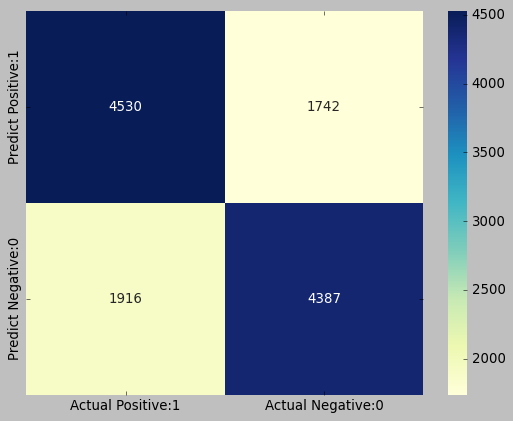

In [128]:
# visualize confusion matrix with seaborn heatmap
matrix_svm = pd.DataFrame(data=matrix_svm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(matrix_svm, annot=True, fmt='d', cmap='YlGnBu')

confusion matrix diatas menunjukkan `4530 + 4387 = 8917 prediksi benar` and `1742 + 1916 = 3658 prediksi salah`.

In this case, we have
- `True Positives` (Actual Positive:1 and Predict Positive:1) - 4530

- `True Negatives` (Actual Negative:0 and Predict Negative:0) - 4387

- `False Positives` (Actual Negative:0 but Predict Positive:1) - 1742 `(Type I error)`

- `False Negatives` (Actual Positive:1 but Predict Negative:0) - 1916 `(Type II error)`

In [129]:
#Metrics Performance for SVM Model
print(classification_report(y_test, y_pred_svm))

              precision    recall  f1-score   support

           0       0.70      0.72      0.71      6272
           1       0.72      0.70      0.71      6303

    accuracy                           0.71     12575
   macro avg       0.71      0.71      0.71     12575
weighted avg       0.71      0.71      0.71     12575



In [130]:
print('Ringkasan Evaluasi Model SVM')
print('Akurasi : {0:0.4f}'. format(acc_svm))
print('Presisi : {0:0.4f}'. format(precision_score(y_test,y_pred_svm)))
print('Recall : {0:0.4f}'. format( recall_score(y_test,y_pred_svm)))
print('F1 Score : {0:0.4f}'. format(f1_score(y_test,y_pred_svm)))

Ringkasan Evaluasi Model SVM
Akurasi : 0.7091
Presisi : 0.7158
Recall : 0.6960
F1 Score : 0.7058


Berdasarkan ringkasan evaluasi **model svm** yang diberikan, dapat diambil kesimpulan sebagai berikut:

* Akurasi model adalah sebesar 0.7091, artinya model dapat memprediksi dengan benar sekitar 80.26% dari total data yang ada.
* Presisi model adalah sebesar 0.7158, artinya dari semua prediksi positif yang dilakukan oleh model, sekitar 64,07% di antaranya adalah benar positif.
* Recall model adalah sebesar 0.6960, artinya dari semua nilai aktual positif yang ada, model dapat mengidentifikasi sekitar 25.52% di antaranya sebagai hasil prediksi positif.
* F1 score model adalah sebesar 0.7058, yang merupakan harmonic mean antara precision dan recall. Semakin tinggi nilai F1 score, semakin baik pula kinerja model dalam melakukan prediksi.

### Kesimpulan Model SVM
1. Nilai akurasi model regresi logistik sebesar 0,7091. Jadi, model melakukan pekerjaan yang sangat baik dalam memprediksi apakah besok akan hujan atau tidak di Australia.
2. Pengamatan dalam jumlah kecil memperkirakan bahwa akan ada hujan besok. Mayoritas pengamatan memprediksi bahwa besok tidak akan turun hujan.
3. Model tidak menunjukkan tanda-tanda overfitting.
4. Confusion matrix menunjukkan 8.917 prediksi benar dan 3.658 prediksi salah
5. Skor model akurasi adalah 0,7091. Skor validasi silang rata-rata adalah 0,7170. Jadi, kita dapat menyimpulkan bahwa validasi silang tidak menghasilkan peningkatan kinerja.

## Perbandingan Model

In [131]:
print('Ringkasan Evaluasi Model LR')
print('Akurasi : {0:0.4f}'. format(acc_lr))
print('Presisi : {0:0.4f}'. format(precision_score(y_test,y_pred_lr)))
print('Recall : {0:0.4f}'. format(recall_score(y_test,y_pred_lr)))
print('F1 Score : {0:0.4f}'. format(f1_score(y_test,y_pred_lr)))
print('\n')
print('Ringkasan Evaluasi Model SVM')
print('Akurasi : {0:0.4f}'. format(acc_svm))
print('Presisi : {0:0.4f}'. format(precision_score(y_test,y_pred_svm)))
print('Recall : {0:0.4f}'. format( recall_score(y_test,y_pred_svm)))
print('F1 Score : {0:0.4f}'. format(f1_score(y_test,y_pred_svm)))

Ringkasan Evaluasi Model LR
Akurasi : 0.7083
Presisi : 0.7152
Recall : 0.6946
F1 Score : 0.7048


Ringkasan Evaluasi Model SVM
Akurasi : 0.7091
Presisi : 0.7158
Recall : 0.6960
F1 Score : 0.7058


    Dari ringkasan evaluasi model LR dan SVM, kedua model memiliki performa yang hampir sama dengan akurasi dan F1 score sekitar 70%. Nilai presisi dan recall juga cukup seimbang. 
    
    Namun, nilai akurasi, presisi, recall dan f1 score model svm lebih tinggi dari pada model logistik regresi.

    Pada kasus ini, performa model LR dan SVM cukup seimbang antara data train dan test dengan perbedaan skor yang tidak terlalu jauh. Oleh karena itu, dapat dikatakan bahwa model ini tidak mengalami overfitting atau underfitting. 
    
    Namun, skor akurasi, presisi, recall dan f1 score pada kedua model sudah cukup baik (> 0.7).

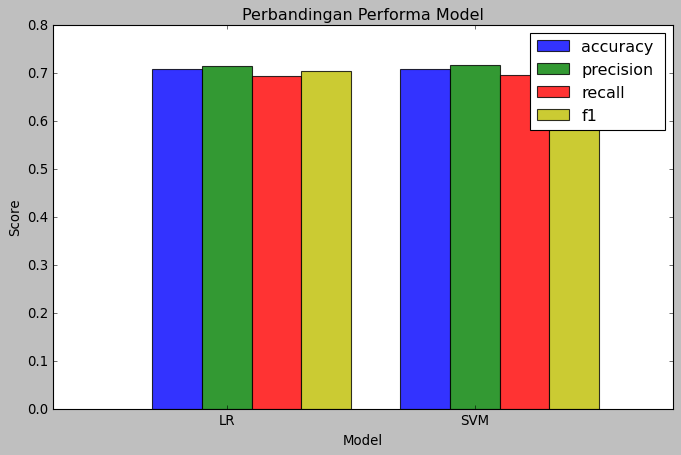

In [132]:
# Data untuk plotting
models = ['LR', 'SVM']
accuracy = [accuracy_score(y_test, y_pred_lr), accuracy_score(y_test, y_pred_svm)]
precision = [precision_score(y_test, y_pred_lr), precision_score(y_test, y_pred_svm)]
recall = [recall_score(y_test, y_pred_lr), recall_score(y_test, y_pred_svm)]
f1 = [f1_score(y_test, y_pred_lr), f1_score(y_test, y_pred_svm)]

# Plotting
fig, ax = plt.subplots(figsize=(10,6))
bar_width = 0.2
opacity = 0.8
index = np.arange(len(models))

ax.bar(index, accuracy, bar_width, alpha=opacity, color='b', label='accuracy ')
ax.bar(index + bar_width, precision, bar_width, alpha=opacity, color='g', label='precision')
ax.bar(index + 2*bar_width, recall, bar_width, alpha=opacity, color='r', label='recall')
ax.bar(index + 3*bar_width, f1, bar_width, alpha=opacity, color='y', label='f1')

# Konfigurasi plot
ax.set_title('Perbandingan Performa Model')
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_xticks(index + bar_width)
ax.set_xticklabels(models)
ax.legend()

plt.show()

In [133]:
# buat array dengan nilai akurasi tiap model
accuracies = np.array([acc_lr, acc_svm])

# cari index dengan nilai akurasi tertinggi
max_index = np.argmax(accuracies)

# buat array dengan nama model
models = np.array(['Linear Regression', 'Suuport Vector Machine'])

# cetak nama model dengan akurasi tertinggi dan nilai akurasinya
print("Model dengan score tertinggi adalah", models[max_index], "dengan nilai score sebesar", accuracies[max_index])

Model dengan score tertinggi adalah Suuport Vector Machine dengan nilai score sebesar 0.7091053677932405


# CONCLUSION
Pada bab terakhir ini, harus berisi kesimpulan yang mencerminkan hasil yang didapat dengan dibandingkan dengan objective yang sudah ditulis di bagian pengenalan.

## Kesimpulan terhadap EDA :

* Portland merupakan kota di wilayah Pasifik Barat laut Amerika Serikat yang memiliki curah hujan yang paling tinggi. Beberapa faktor yang menyebabkan hal ini antara lain letak geografis yang berhadapan langsung dengan Samudra Pasifik, medan pegunungan yang dapat mempengaruhi pola aliran udara, serta pola aliran udara yang mengarah ke wilayah pesisir barat laut Amerika Serikat selama musim dingin.
* Frekuensi angin dari arah barat di Australia mungkin tinggi karena wilayah tersebut memiliki relief topografi yang beragam dan terletak dekat garis khatulistiwa. Sedangkan frekuensi angin dari arah timur tenggara rendah karena wilayah tersebut tidak memiliki kecenderungan angin dari arah itu.
* Distribusi curah hujan relatif seragam di seluruh lokasi, namun terdapat beberapa lokasi yang memiliki curah hujan yang lebih rendah dibandingkan dengan lokasi lainnya. Beberapa lokasi yang terlihat memiliki curah hujan yang lebih rendah antara lain  Nhil, Katherine, dan Uluru. Sedangkan Portland menerima curah hujan paling banyak di antara 49 lokasi yang tersedia dalam dataset.
* Semakin banyak awan pada pukul 3 sore, semakin tinggi kemungkinan turun hujan besok. Ketika jumlah awan mencapai 6, kemungkinan turun hujan besok mencapai puncaknya. Sedangkan ketika jumlah awan semakin sedikit, kemungkinan hujan besok cenderung rendah. Hal ini mungkin disebabkan oleh fakta bahwa awan adalah indikator utama cuaca hujan, dan semakin banyak awan, semakin besar kemungkinan terjadi hujan.
* Dapat dilihat bahwa ketika hari ini turun hujan, kemungkinan besok juga turun hujan lebih tinggi dibandingkan ketika hari ini tidak turun hujan. 

## Kesimpulan terhadap model :

* Berdasarkan Metrics Performence untuk Logistic Regression dan Support Vector Machine model, keduanya memberikan nilai yang sangat bagus serta kedua model tersebut memiliki akurasi yang tidak jauh berbeda. 
* Akurasi LR : 0.7083 lebih besar dibandingkan Akurasi SVM : 0.7091
* Akurasi kedua model tersebut berada pada nilai 70%, sehingga untuk memprediksi kejadian hujan untuk selanjutnya bisa menggunakan SVM atau Logistic Regression tergantung kebutuhan, karena keduanya menghasilkan tingkat akurasi model yang nilainya hampir sama
* Pada kasus ini, performa model LR dan SVM cukup seimbang antara data train dan test dengan perbedaan skor yang tidak terlalu jauh. Oleh karena itu, dapat dikatakan bahwa model ini tidak mengalami overfitting atau underfitting.
* Skor akurasi, presisi, recall dan f1 score pada kedua model sudah cukup baik (> 0.7).